In [1]:
from typing import Dict,Callable

from tempfile import gettempdir
import matplotlib.pyplot as plt
import numpy as np

import torch
from torch import optim,Tensor,unsqueeze
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import torch.autograd
import torch.nn as nn
from torchvision.models.resnet import resnet50,resnet18
import torchvision.transforms as transforms
from torchvision import datasets
from torchvision.utils import save_image
import torch.nn.functional as F

from mydataset import MyTrainDataset, my_dataset_worker_init_func

from tqdm import tqdm

from l5kit.configs import load_config_data
from l5kit.data import LocalDataManager, ChunkedDataset
from l5kit.dataset import AgentDataset, EgoDataset
from l5kit.rasterization import build_rasterizer
from l5kit.evaluation import write_pred_csv, compute_metrics_csv, write_gt_csv, read_gt_csv
from l5kit.evaluation.chop_dataset import MIN_FUTURE_STEPS
from l5kit.evaluation.metrics import neg_multi_log_likelihood, time_displace, average_displacement_error_mean, final_displacement_error_mean
from l5kit.geometry import transform_points
from l5kit.visualization import PREDICTED_POINTS_COLOR, TARGET_POINTS_COLOR, draw_trajectory
from prettytable import PrettyTable
from pathlib import Path

import os
os.environ["KMP_DUPLICATE_LIB_OK"]="True"

D:\anaconda3\envs\stgm\lib\site-packages\l5kit\dataset\select_agents.py:32: UserWarning: Windows detected. BLOSC_NOLOCK has not been set as it causes memory leaks on Windows.However, writing the mask with this config may be inconsistent.
  "Windows detected. BLOSC_NOLOCK has not been set as it causes memory leaks on Windows."


# 数据处理

In [2]:
# set env variable for data
os.environ["L5KIT_DATA_FOLDER"] = "E:/Downloads/lyft-motion-prediction-autonomous-vehicles"
dm = LocalDataManager(None)
# get config
cfg = load_config_data("./agent_motion_config.yaml")
print(cfg)

{'format_version': 4, 'mode': {'load_mode': True}, 'model_params': {'model_architecture': 'CVAE', 'latent_dim': 256, 'num_layers': 2, 'bidirectional': True, 'history_step_size': 1, 'history_num_frames': 49, 'future_step_size': 1, 'future_num_frames': 50, 'step_time': 0.1, 'render_ego_history': True}, 'raster_params': {'raster_mode': 1, 'raster_size': [112, 112], 'pixel_size': [0.75, 0.75], 'ego_center': [0.25, 0.5], 'map_type': 'py_semantic', 'satellite_map_key': 'aerial_map/aerial_map.png', 'semantic_map_key': 'semantic_map/semantic_map.pb', 'dataset_meta_key': 'meta.json', 'filter_agents_threshold': 0.5, 'disable_traffic_light_faces': False, 'set_origin_to_bottom': True}, 'train_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 16, 'shuffle': True, 'num_workers': 6}, 'val_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 16, 'shuffle': False, 'num_workers': 5}, 'train_params': {'device': 1, 'epochs': 1}}


In [3]:
if not cfg['mode']['load_mode']:    
    # ===== INIT DATASET
    train_cfg = cfg["train_data_loader"]
    rasterizer = build_rasterizer(cfg, dm)
    train_zarr = ChunkedDataset(dm.require(train_cfg["key"])).open()
    train_dataset = AgentDataset(cfg, train_zarr, rasterizer)
    print(len(train_dataset))
    print(train_dataset)
    print(train_dataset[0].keys())

    train_dataset = MyTrainDataset(cfg, dm, len(train_dataset),raster_mode = cfg["raster_params"]["raster_mode"])
    train_dataloader = DataLoader(
        train_dataset,
        shuffle=train_cfg["shuffle"], 
        batch_size=train_cfg["batch_size"],
        num_workers=train_cfg["num_workers"],
        prefetch_factor = 2,
        pin_memory = True,
        persistent_workers=True,
        worker_init_fn=my_dataset_worker_init_func
    )

# 参数

In [4]:
# 基本参数
if cfg["train_params"]["device"] == 1:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
torch.backends.cudnn.benchmark = True

epochs = cfg["train_params"]["epochs"]
latent_dim = cfg["model_params"]["latent_dim"]  # LSTM 的单元个数
encoder_fc = 64
num_layers = cfg["model_params"]["num_layers"]
bidirectional = cfg["model_params"]["bidirectional"]

encoder_length = cfg["model_params"]["history_num_frames"]
decoder_length = cfg["model_params"]["future_num_frames"]
num_encoder_tokens = 2
num_decoder_tokens = 2
z_dimension = 32
accumulation_steps = 5 # 梯度累积步数

num_classes = 3 # 类数
modal_fc = latent_dim*(1+bidirectional) 
thre = 0.175 # yaw_threshold=10°

In [5]:
def neg_multi_log_likelihood_batch(
    gt: Tensor, pred: Tensor, confidences: Tensor, avails: Tensor
) -> Tensor:
    assert len(pred.shape) == 4, f"expected 3D (MxTxC) array for pred, got {pred.shape}"
    batch_size, num_modes, future_len, num_coords = pred.shape

    assert gt.shape == (batch_size, future_len, num_coords), f"expected 2D (Time x Coords) array for gt, got {gt.shape}"
    assert confidences.shape == (batch_size, num_modes), f"expected 1D (Modes) array for gt, got {confidences.shape}"
    assert torch.allclose(torch.sum(confidences, dim=1), confidences.new_ones((batch_size,))), "confidences should sum to 1"
    assert avails.shape == (batch_size, future_len), f"expected 1D (Time) array for gt, got {avails.shape}"
    # assert all data are valid
    assert torch.isfinite(pred).all(), "invalid value found in pred"
    assert torch.isfinite(gt).all(), "invalid value found in gt"
    assert torch.isfinite(confidences).all(), "invalid value found in confidences"
    assert torch.isfinite(avails).all(), "invalid value found in avails"

    # convert to (batch_size, num_modes, future_len, num_coords)
    gt = torch.unsqueeze(gt, 1)  # add modes
    avails = avails[:, None, :, None]  # add modes and cords

    # error (batch_size, num_modes, future_len)
    error = torch.sum(((gt - pred) * avails) ** 2, dim=-1)  # reduce coords and use availability

    with np.errstate(divide="ignore"):  # when confidence is 0 log goes to -inf, but we're fine with it
        # error (batch_size, num_modes)
        error = torch.log(confidences) - 0.5 * torch.sum(error, dim=-1)  # reduce time

    # use max aggregator on modes for numerical stability
    # error (batch_size, num_modes)
    max_value, _ = error.max(dim=1, keepdim=True)  # error are negative at this point, so max() gives the minimum one
    error = -torch.log(torch.sum(torch.exp(error - max_value), dim=-1, keepdim=True)) - max_value  # reduce modes
    # print("error", error)
    return torch.mean(error)

# 模型

In [6]:
class CVAE(nn.Module):
    def __init__(self):
        super(CVAE, self).__init__()

        # 定义序列编码器
        self.encoder = nn.LSTM(
            num_encoder_tokens, latent_dim, num_layers=num_layers, bidirectional=bidirectional, batch_first=True)
        self.encoder2 = nn.Linear(latent_dim*(1+bidirectional), encoder_fc)
#         self.encoder2 = nn.Linear(latent_dim*(1+bidirectional)+modal_fc, encoder_fc)
#         self.encoder_mean1 = nn.Linear(latent_dim*(1+bidirectional), 64)
        self.encoder_mean2 = nn.Linear(encoder_fc, z_dimension)
#         self.encoder_std1 = nn.Linear(latent_dim*(1+bidirectional), 32)
        self.encoder_std2 = nn.Linear(encoder_fc, z_dimension)

        # 定义序列解码器
        self.decoder = nn.LSTM(z_dimension*2, latent_dim, num_layers=num_layers,
                               bidirectional=bidirectional, batch_first=True)
        self.decoder_fc = nn.Linear(latent_dim*(1+bidirectional), 64)
        self.decoder_fc1 = nn.Linear(64, num_decoder_tokens)
        self.decoder_fc2 = nn.Linear(64, num_decoder_tokens)
        self.decoder_fc3 = nn.Linear(64, num_decoder_tokens)
        self.decoder_confi = nn.Linear(6, num_classes)

        # 定义图像编码器
        # load pre-trained Conv2D model
        self.resnet = resnet50(pretrained=True)
        # change input channels number to match the rasterizer's output
        num_history_channels = (
            cfg["model_params"]["history_num_frames"] + 1) * 2
        num_in_channels = 3 + num_history_channels
        self.resnet.conv1 = nn.Conv2d(
            num_in_channels,
            self.resnet.conv1.out_channels,
            kernel_size=self.resnet.conv1.kernel_size,
            stride=self.resnet.conv1.stride,
            padding=self.resnet.conv1.padding,
            bias=False,
        )
        # change output size to (X, Y) * number of future states
        num_targets = z_dimension * cfg["model_params"]["future_num_frames"]
        self.resnet.fc = nn.Linear(in_features=2048, out_features=512)
        self.encoder_mean3 = nn.Linear(512, num_targets)
        self.encoder_std3 = nn.Linear(512, num_targets)
        
        #定义采样器
        self.sampler_fc1 = nn.Linear(3,1024)
        self.sampler_fc2 = nn.Linear(1024,512)
        self.sampler_fc3 = nn.Linear(512,z_dimension * cfg["model_params"]["future_num_frames"])
        
        #定义行为预测
        self.modal1 = nn.LSTM(
            num_encoder_tokens, latent_dim, num_layers=num_layers, bidirectional=bidirectional, batch_first=True)
        self.modal2 = nn.Linear(latent_dim*(1+bidirectional), 3)
        
    def noise_reparameterize(self, mean, logvar):
        eps = torch.randn(mean.shape).to(device)
        z = mean + eps * torch.exp(logvar)
        return z

    def forward(self, data):
        inputs1 = torch.FloatTensor(data["history_positions"]).to(device)
#         yaw = torch.FloatTensor(data["history_yaws"]).to(device)
        if inputs1.dim() == 2:
            inputs1 = torch.unsqueeze(inputs1, 0)

        h0 = torch.autograd.Variable(torch.randn(
            num_layers*(1+bidirectional), inputs1.size()[0], latent_dim)).to(device)
        c0 = torch.autograd.Variable(torch.randn(
            num_layers*(1+bidirectional), inputs1.size()[0], latent_dim)).to(device)

        inputs2 = torch.FloatTensor(data["image"]).to(device)
        if inputs2.dim() == 3:
            inputs2 = torch.unsqueeze(inputs2, 0)

        out1, _ = self.encoder(inputs1, (h0, c0))
#         out1 = out1[:,-1,:]
#         out1 = torch.unsqueeze(out1, 1)
#         out1 = out1.expand(out1.size()[0],decoder_length,out1.size()[-1])
        out1 = F.relu(self.encoder2(out1), inplace=True)
        
        out_modal, _ = self.modal1(inputs1, (h0, c0))
        out_modal = F.softmax(self.modal2(out_modal[:, -1, :]), dim = -1)

#         mean1 = F.relu(self.encoder_mean1(out1), inplace=True)
        mean2 = F.relu(self.encoder_mean2(out1), inplace=True)
#         logstd1 = F.relu(self.encoder_std1(out1), inplace=True)
        logstd2 = F.relu(self.encoder_std2(out1), inplace=True)
        # prevent from poster vanish
#         logstd2 = torch.abs(logstd2) + 0.6

        z1 = self.noise_reparameterize(mean2, logstd2)
        z1 = z1[:, -1, :]
        z1 = torch.unsqueeze(z1, 1)
        z1 = z1.expand(z1.size()[0], decoder_length, z1.size()[-1])

        out12 = self.resnet(inputs2)
        mean3 = F.relu(self.encoder_mean3(out12), inplace=True)
        logstd3 = F.relu(self.encoder_std3(out12), inplace=True)
        z2 = self.noise_reparameterize(mean3, logstd3)
        z2 = z2.reshape(z1.size())
        z = torch.cat([z1, z2], -1)
        out2, _ = self.decoder(z)
        out2 = F.relu(self.decoder_fc(out2), inplace=True)

        out21 = F.relu(self.decoder_fc1(out2), inplace=True)
        out22 = F.relu(self.decoder_fc2(out2), inplace=True)
        out23 = F.relu(self.decoder_fc3(out2), inplace=True)
        confs = torch.cat([out21, out22, out23], dim=-1)
        confidences = F.softmax(self.decoder_confi(confs)[:, -1, :], dim=-1)
        confidences = F.softmax(confidences * out_modal, dim=-1)
        
        out21 = torch.unsqueeze(out21, 1)
        out22 = torch.unsqueeze(out22, 1)
        out23 = torch.unsqueeze(out23, 1)
        y_hat = torch.cat([out21, out22, out23], dim=1)

        return y_hat, confidences, mean2, logstd2, mean3, logstd3


def label_maker(yaw):
    yaw = yaw.squeeze()
#     print(yaw.size())
    ind = torch.argmax(torch.abs(yaw), dim=-1)
#     print(ind.size())
    yaw = yaw[torch.arange(len(yaw)), ind]
    yaw = yaw.unsqueeze(dim=-1)
    w = torch.cat([yaw, yaw, yaw], dim=-1)
    one = torch.ones_like(yaw)
    label1 = torch.tensor([0., 0., 1.]).to(device)
    label1 = label1.expand(len(yaw), num_classes)
    label2 = torch.tensor([0., 1., 0.]).to(device)
    label2 = label2.expand(len(yaw), num_classes)
    label3 = torch.tensor([1., 0., 0.]).to(device)
    label3 = label3.expand(len(yaw), num_classes)

    w = torch.where(yaw >= thre, label1, w)
    yaw = torch.where(yaw >= thre, one, yaw)

    w = torch.where(yaw <= -thre, label3, w)
    yaw = torch.where(yaw <= -thre, one, yaw)

    w = torch.where(yaw < thre, label2, w)
#     w = torch.LongTensor(w).to(device)
    return w


def loss_function(y_hat, confidences, data, mean1, std1, mean2, std2):
    y_availabilities = data["target_availabilities"].to(device)
    yaw = data["target_yaws"].to(device)
    label = label_maker(yaw)
    y_true = data["target_positions"].to(device)
#     MSE = F.mse_loss(y_hat, y_true, reduction='none')
#     MSE = MSE * y_availabilities
#     MSE = MSE.mean()
    Cross = F.binary_cross_entropy_with_logits(confidences, label)
    NLL = neg_multi_log_likelihood_batch(
        y_true, y_hat, confidences, y_availabilities)
    # 因为var是标准差的自然对数，先求自然对数然后平方转换成方差
    var1 = torch.pow(torch.exp(std1), 2)
    var2 = torch.pow(torch.exp(std2), 2)
    KLD1 = -0.5 * torch.mean(1+torch.log(var1)-torch.pow(mean1, 2)-var1)
    KLD1 = torch.max(KLD1,torch.ones_like(KLD1))
    KLD2 = -0.5 * torch.mean(1+torch.log(var2)-torch.pow(mean2, 2)-var2)
    KLD2 = torch.max(KLD2,torch.ones_like(KLD2))
    KLD = KLD1 + KLD2
#     print('KLD: ',KLD,' NLL: ',NLL,' Cross: ', Cross)
    return NLL, KLD, Cross


# 创建对象
cvae = CVAE().to(device)
# vae.load_state_dict(torch.load('./VAE_z2.pth'))
cvae_optimizer = torch.optim.Adam(cvae.parameters(), lr=1e-4)

In [7]:
if not cfg['mode']['load_mode']:    
    # ==== TRAIN LOOP
    losses_avg = []
    for epoch in range(epochs):  # 进行多个epoch的训练
        tr_it = iter(train_dataloader)
        progress_bar = tqdm(range(len(train_dataloader)//1),position=0)
        losses_train = []
        cvae_optimizer.zero_grad(set_to_none = True)
        for i in progress_bar:
            try:
                data = next(tr_it)
            except StopIteration:
                tr_it = iter(train_dataloader)
                data = next(tr_it)
            cvae.train() # 设置为训练模式
            torch.set_grad_enabled(True)
            y_hat, confidences, mean1, std1, mean2, std2 = cvae(data)  # 输入
            if cfg["train_params"]["device"] == 1:
                with torch.cuda.amp.autocast():
                    NLL,KLD,Cross = loss_function(y_hat, confidences, data, mean1, std1, mean2, std2)
                    loss = NLL + (25)*KLD + 20*Cross
                    if i + 1>= len(train_dataloader)//1:
                        print(NLL,KLD,Cross)
            else:
                NLL,KLD,Cross = loss_function(y_hat, confidences, data, mean1, std1, mean2, std2)
                loss = NLL + (25)*KLD + 20*Cross
                if i + 1>= len(train_dataloader)//1:
                    print(NLL,KLD,Cross)

            # Backward pass
            # 梯度累积模式
            loss = loss / accumulation_steps
            loss.backward() 
            if (i+1) % accumulation_steps == 0:
                cvae_optimizer.step()
                cvae_optimizer.zero_grad(set_to_none = True)

            # 无梯度累积模式
    #         cvae_optimizer.zero_grad(set_to_none = True)
    #         loss.backward()
    #         cvae_optimizer.step()
            losses_train.append(loss.item())
            progress_bar.set_description(f"loss: {loss.item()} loss(avg): {np.mean(losses_train)}")
        losses_avg.append(np.mean(losses_train))

# 结果

In [8]:
if not cfg['mode']['load_mode']:    
    torch.save(cvae.state_dict(),'E:/Downloads/cvae.pth')
    plt.plot(np.arange(len(losses_train)), losses_train, label="train loss")
    plt.legend()
    plt.show()

In [9]:
if not cfg['mode']['load_mode'] and cfg['train_params']['epochs'] > 1: 
    plt.plot(np.arange(len(losses_avg)), losses_avg, label="train loss")
    plt.legend()
    plt.show()

# 评估

In [10]:
eval_cfg = cfg["val_data_loader"]
rasterizer = build_rasterizer(cfg, dm)
eval_zarr = ChunkedDataset(dm.require(eval_cfg["key"])).open()
eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer)
print(len(eval_dataset))
print(eval_dataset[0].keys())
# print(len(eval_dataset))

eval_dataset = MyTrainDataset(cfg, dm, len(eval_dataset),raster_mode = cfg["raster_params"]["raster_mode"])
eval_dataloader = DataLoader(
    eval_dataset,
    shuffle=eval_cfg["shuffle"], 
    batch_size=eval_cfg["batch_size"],
    num_workers=eval_cfg["num_workers"],
    prefetch_factor = 2,
    persistent_workers=True,
    pin_memory = True,
    worker_init_fn=my_dataset_worker_init_func
)
pred_path = "E:/Downloads/pred.csv"
eval_gt_path = "E:/Downloads/gt.csv"
cvae.load_state_dict(torch.load('E:/Downloads/cvae.pth'))
print(len(eval_dataloader))

111634
dict_keys(['frame_index', 'image', 'target_positions', 'target_yaws', 'target_velocities', 'target_availabilities', 'history_positions', 'history_yaws', 'history_velocities', 'history_availabilities', 'world_to_image', 'raster_from_agent', 'raster_from_world', 'agent_from_world', 'world_from_agent', 'centroid', 'yaw', 'extent', 'history_extents', 'future_extents', 'curr_speed', 'scene_index', 'host_id', 'timestamp', 'track_id'])
6978


## 保存预测

In [11]:
# ==== EVAL LOOP
cvae.eval()
torch.set_grad_enabled(False)
losses_test = []

# store information for evaluation
future_coords_offsets_pd = []
gt_coords_offsets_pd = []
timestamps = []
agent_ids = []
availability = []
confs = []
tr_it = iter(eval_dataloader)
progress_bar = tqdm(range(len(eval_dataloader)//1),position=0)

for i in progress_bar:
    try:
        data = next(tr_it)
    except StopIteration:
        tr_it = iter(eval_dataloader)
        data = next(tr_it)
    y_hat, confidences,mean1,std1,mean2,std2 = cvae(data)
    if cfg["train_params"]["device"] == 1:
        with torch.cuda.amp.autocast():
            NLL,KLD,Cross = loss_function(y_hat, confidences, data, mean1, std1, mean2, std2)
            loss = NLL + (25)*KLD + 20*Cross
    losses_test.append(loss.item())
    progress_bar.set_description(f"loss: {loss.item()} loss(avg): {np.mean(losses_test)}")
#     print(data)
    # convert agent coordinates into world offsets
    agents_coords = y_hat.detach().cpu().numpy()
    gt_coords = data['target_positions'].numpy()
    world_from_agents = data['world_from_agent'].numpy()
    centroids = data["centroid"].numpy()
    coords_offset1 = transform_points(agents_coords[:,0,:,:], world_from_agents) - centroids[:, None, :2]
    coords_offset2 = transform_points(agents_coords[:,1,:,:], world_from_agents) - centroids[:, None, :2]
    coords_offset3 = transform_points(agents_coords[:,2,:,:], world_from_agents) - centroids[:, None, :2]
    coords_offset = np.stack([coords_offset1,coords_offset2,coords_offset3],1)
    gt_offset = transform_points(gt_coords, world_from_agents) - centroids[:, None, :2]
    
    future_coords_offsets_pd.append(np.stack(coords_offset))
    gt_coords_offsets_pd.append(np.stack(gt_offset))
    timestamps.append(data["timestamp"].numpy().copy())
    agent_ids.append(data["track_id"].numpy().copy())
    availability.append(data["target_availabilities"].numpy().copy())
    confs.append(confidences.detach().cpu().numpy().copy())

write_pred_csv(pred_path,
               timestamps=np.concatenate(timestamps),
               track_ids=np.concatenate(agent_ids),
               coords=np.concatenate(future_coords_offsets_pd),
               confs=np.concatenate(confs)
              )

write_gt_csv(eval_gt_path,timestamps=np.concatenate(timestamps),
               track_ids=np.concatenate(agent_ids),
               coords=np.concatenate(gt_coords_offsets_pd),avails=np.concatenate(availability))

loss: 63.721248626708984 loss(avg): 145.99575935335344: 100%|██████████████████████| 6978/6978 [23:50<00:00,  4.88it/s]


## 预测结果

In [12]:
metrics = compute_metrics_csv(eval_gt_path, pred_path, [
                              neg_multi_log_likelihood, time_displace])
for metric_name, metric_mean in metrics.items():
    print(metric_name, metric_mean)
    if metric_name=="time_displace":
        FDE = metric_mean
print('FDE1s: {}, FDE3s: {}, FDE5s: {}, ADE1s: {}, ADE3s: {}, ADE5s: {} '.format(
    FDE[10//cfg["model_params"]["future_step_size"]-1], FDE[30//cfg["model_params"]["future_step_size"]-1], FDE[50//cfg["model_params"]["future_step_size"]-1], np.mean(FDE[:10//cfg["model_params"]["future_step_size"]]), np.mean(FDE[:30//cfg["model_params"]["future_step_size"]]), np.mean(FDE[:50//cfg["model_params"]["future_step_size"]])))

neg_multi_log_likelihood 72.62356439418461
time_displace [0.14584128 0.19809163 0.18923104 0.24248247 0.2601437  0.29629242
 0.31719773 0.34352096 0.36549588 0.38962134 0.41094575 0.43036304
 0.45237229 0.47206138 0.49168953 0.50569874 0.52420033 0.54683644
 0.56721931 0.58192138 0.59632724 0.61237846 0.62771827 0.64151095
 0.65710702 0.67380151 0.69193869 0.70487035 0.71873457 0.73211275
 0.7466363  0.76019717 0.77566435 0.79048552 0.80672489 0.82302615
 0.83822072 0.85641896 0.87661333 0.8964539  0.91752467 0.93946245
 0.96632362 0.99519455 1.0310978  1.07140603 1.12509542 1.20823864
 1.31866271 1.68779681]
FDE1s: 0.3896213363371146, FDE3s: 0.7321127455479521, FDE5s: 1.687796807492836, ADE1s: 0.2747918448637881, ADE3s: 0.4795908816279985, ADE5s: 0.6763794087231589 


[[0.21745221 0.5650956  0.2174522 ]]
[[0.21194208 0.57611585 0.21194208]]


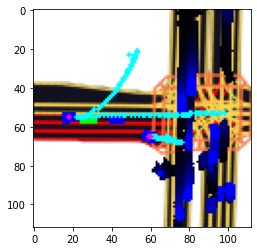

[[0.21196873 0.5760625  0.21196873]]
[[0.21789159 0.56421685 0.21789157]]
[[0.21965992 0.56068015 0.21965988]]


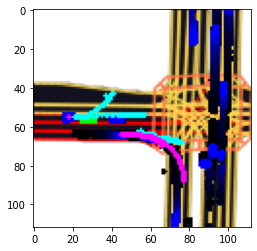

[[0.21194279 0.57611436 0.21194279]]


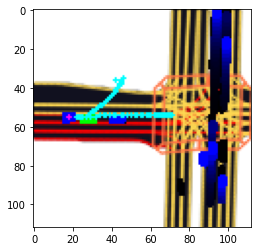

[[0.21194214 0.5761157  0.21194214]]


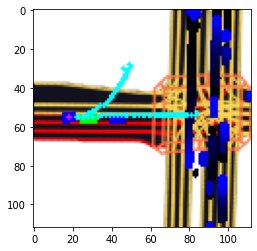

[[0.21194215 0.5761157  0.21194215]]


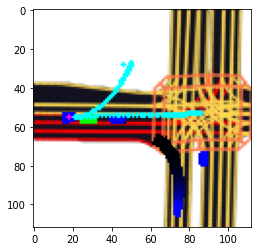

[[0.21194208 0.57611585 0.21194208]]
[[0.2208374  0.5583253  0.22083731]]


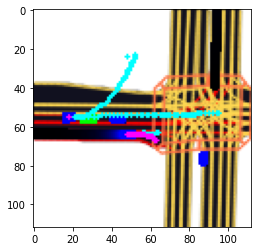

[[0.21194234 0.5761153  0.21194234]]
[[0.21194215 0.57611567 0.21194215]]


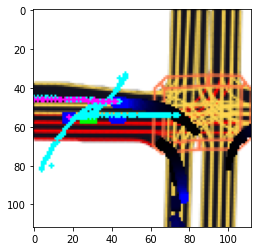

[[0.21194208 0.57611585 0.21194208]]


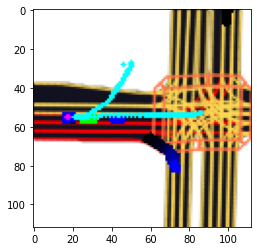

[[0.21260129 0.5747974  0.21260129]]
[[0.21251193 0.57497615 0.21251193]]
[[0.21286406 0.5742719  0.21286406]]
[[0.21211448 0.575771   0.21211448]]
[[0.21223561 0.57552874 0.21223561]]


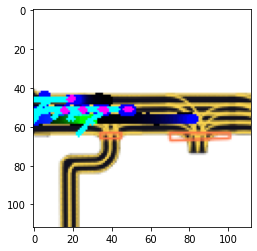

[[0.21265614 0.5746877  0.21265614]]
[[0.21309222 0.5738155  0.21309222]]


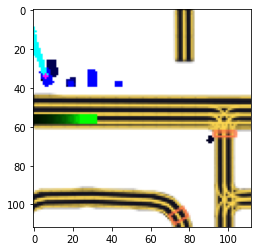

[[0.21194425 0.57611156 0.21194425]]


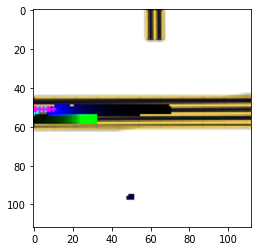

[[0.21196866 0.5760627  0.21196866]]


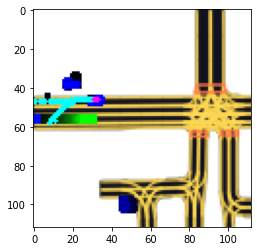

[[0.21217465 0.57565075 0.21217465]]


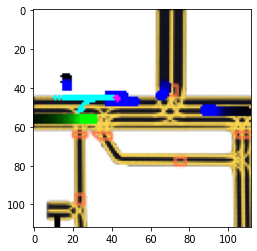

[[0.21282344 0.57435316 0.21282344]]
[[0.21221465 0.5755707  0.21221465]]
[[0.21417563 0.5716487  0.21417561]]
[[0.21215019 0.5756996  0.21215019]]
[[0.21194223 0.57611555 0.21194223]]


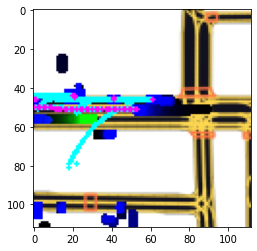

[[0.21442562 0.5711488  0.21442561]]
[[0.2156204  0.56875926 0.21562037]]
[[0.21667594 0.5666481  0.21667592]]
[[0.21642159 0.56715685 0.21642156]]
[[0.21199222 0.5760156  0.21199222]]
[[0.22077331 0.55845344 0.22077326]]


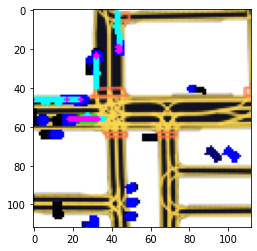

[[0.21202607 0.5759479  0.21202607]]
[[0.21217509 0.5756498  0.21217509]]
[[0.21197547 0.5760491  0.21197547]]
[[0.21195573 0.5760886  0.21195573]]


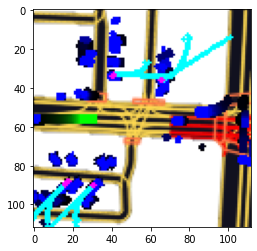

[[0.21449986 0.57100034 0.21449983]]
[[0.21195863 0.5760827  0.21195863]]
[[0.21223223 0.57553554 0.21223223]]
[[0.21195242 0.57609516 0.21195242]]


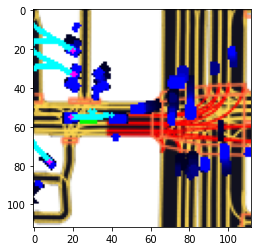

[[0.21741647 0.5651671  0.21741647]]
[[0.21199599 0.576008   0.21199599]]
[[0.21200652 0.5759869  0.21200652]]
[[0.21237189 0.5752562  0.21237189]]
[[0.21195827 0.5760834  0.21195827]]


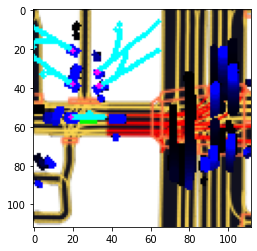

[[0.21522647 0.56954706 0.21522646]]
[[0.21197543 0.57604915 0.21197543]]
[[0.21205576 0.57588845 0.21205576]]
[[0.21203895 0.5759221  0.21203895]]
[[0.21203403 0.5759319  0.21203403]]
[[0.21827246 0.5634551  0.21827245]]
[[0.21194302 0.576114   0.21194302]]


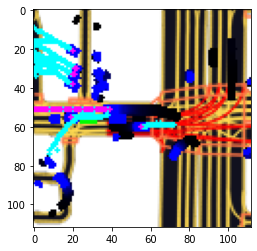

[[0.21717359 0.5656529  0.21717355]]
[[0.21364391 0.57271224 0.2136439 ]]
[[0.21679161 0.5664168  0.21679159]]
[[0.21199404 0.57601196 0.21199404]]
[[0.21219568 0.5756086  0.21219568]]
[[0.2121987 0.5756026 0.2121987]]
[[0.21194437 0.5761113  0.21194437]]
[[0.21236548 0.57526904 0.21236548]]
[[0.21194215 0.5761157  0.21194215]]


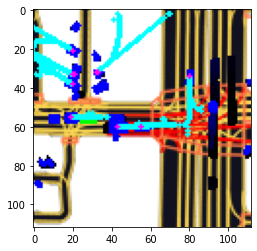

[[0.21215783 0.57568437 0.21215783]]
[[0.21199088 0.5760183  0.21199088]]
[[0.2121902 0.5756196 0.2121902]]
[[0.21197756 0.57604486 0.21197756]]
[[0.21194243 0.57611513 0.21194243]]
[[0.21379144 0.57241714 0.21379142]]


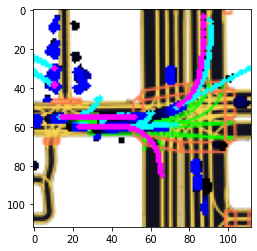

[[0.21201693 0.5759661  0.21201693]]
[[0.2119422  0.57611555 0.2119422 ]]
[[0.21209344 0.5758131  0.21209344]]
[[0.21218273 0.57563454 0.21218273]]
[[0.2141538  0.5716924  0.21415378]]
[[0.21219712 0.57560575 0.21219712]]
[[0.2120445 0.575911  0.2120445]]
[[0.21194226 0.5761155  0.21194226]]


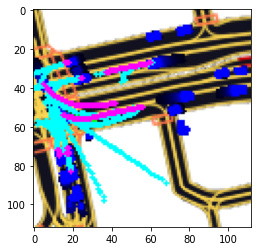

[[0.21599023 0.56801957 0.21599017]]
[[0.21448739 0.5710252  0.21448739]]
[[0.21262315 0.57475364 0.21262315]]
[[0.21341419 0.57317156 0.21341419]]
[[0.21209824 0.5758035  0.21209824]]
[[0.21387321 0.5722536  0.2138732 ]]
[[0.2124824 0.5750352 0.2124824]]
[[0.21290003 0.5742     0.21290003]]
[[0.21489634 0.57020736 0.21489632]]
[[0.21238916 0.5752217  0.21238916]]


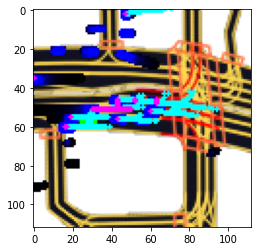

[[0.21872286 0.5625543  0.21872282]]
[[0.21202488 0.5759502  0.21202488]]
[[0.21488467 0.57023066 0.21488465]]
[[0.21261139 0.57477725 0.21261139]]
[[0.21209654 0.5758069  0.21209654]]
[[0.21299948 0.5740011  0.21299948]]
[[0.21201798 0.575964   0.21201798]]
[[0.21195064 0.57609874 0.21195064]]
[[0.21199149 0.5760171  0.21199149]]
[[0.21209015 0.5758197  0.21209015]]
[[0.21250041 0.5749992  0.21250041]]


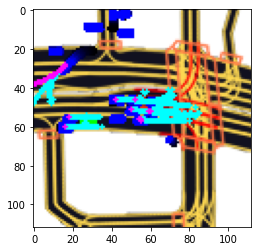

[[0.21236347 0.5752731  0.21236347]]
[[0.21194983 0.5761004  0.21194983]]
[[0.21200928 0.57598144 0.21200928]]
[[0.2122799  0.57544017 0.2122799 ]]
[[0.2136818  0.5726364  0.21368177]]
[[0.21245816 0.5750837  0.21245816]]
[[0.21224669 0.5755066  0.21224669]]
[[0.2153732  0.56925356 0.21537319]]
[[0.21197586 0.5760483  0.21197586]]
[[0.21194844 0.5761031  0.21194844]]
[[0.21742038 0.56515926 0.21742037]]
[[0.21297869 0.5740426  0.21297869]]


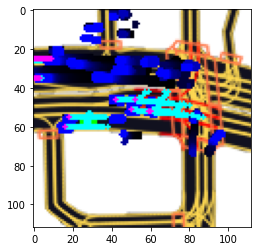

[[0.21194208 0.5761159  0.21194208]]
[[0.21199149 0.5760171  0.21199149]]
[[0.21205321 0.5758936  0.21205321]]
[[0.2119422 0.5761156 0.2119422]]
[[0.21300042 0.5739992  0.21300042]]
[[0.21194214 0.5761157  0.21194214]]
[[0.21210693 0.5757861  0.21210693]]
[[0.2122519  0.57549614 0.2122519 ]]
[[0.21200936 0.57598126 0.21200936]]
[[0.21261252 0.5747749  0.21261252]]
[[0.21645938 0.5670813  0.21645935]]
[[0.21540628 0.5691874  0.21540627]]
[[0.21536364 0.5692727  0.21536362]]
[[0.21203668 0.57592666 0.21203668]]
[[0.21643792 0.5671242  0.2164379 ]]


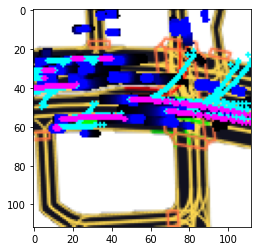

[[0.213041 0.573918 0.213041]]
[[0.21209729 0.5758054  0.21209729]]
[[0.21226023 0.5754795  0.21226023]]
[[0.21195439 0.57609123 0.21195439]]
[[0.21210504 0.5757899  0.21210504]]


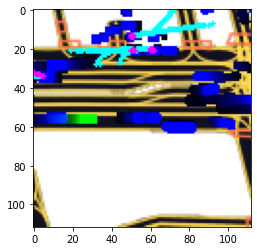

[[0.21194421 0.57611156 0.21194421]]
[[0.2146596  0.5706808  0.21465959]]
[[0.21240477 0.5751904  0.21240477]]
[[0.2119597 0.5760806 0.2119597]]
[[0.21194251 0.57611495 0.21194251]]
[[0.21672085 0.5665583  0.21672085]]
[[0.2119422 0.5761156 0.2119422]]


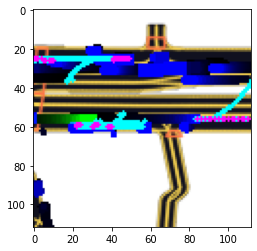

[[0.21234588 0.5753082  0.21234588]]
[[0.21238701 0.575226   0.21238701]]
[[0.21251039 0.5749792  0.21251039]]
[[0.21424444 0.5715111  0.21424443]]
[[0.21413928 0.57172143 0.21413927]]


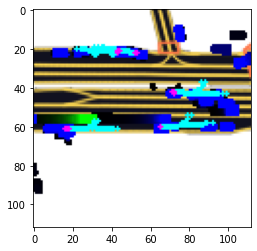

[[0.2119865 0.576027  0.2119865]]
[[0.21213171 0.5757366  0.21213171]]
[[0.2133367  0.57332665 0.2133367 ]]
[[0.21205567 0.5758887  0.21205567]]
[[0.21198037 0.5760392  0.21198037]]
[[0.21208875 0.5758225  0.21208875]]
[[0.21233246 0.5753351  0.21233246]]
[[0.21201482 0.5759703  0.21201482]]
[[0.21198456 0.57603085 0.21198456]]
[[0.2120173 0.5759654 0.2120173]]
[[0.2135112  0.57297766 0.2135112 ]]
[[0.21197873 0.57604253 0.21197873]]


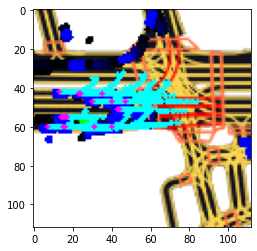

[[0.21197554 0.5760489  0.21197554]]
[[0.21194726 0.5761055  0.21194726]]
[[0.21202147 0.57595706 0.21202147]]
[[0.21202685 0.5759463  0.21202685]]
[[0.21231529 0.5753694  0.21231529]]
[[0.21206495 0.57587004 0.21206495]]
[[0.21222225 0.5755555  0.21222225]]
[[0.21195343 0.57609314 0.21195343]]
[[0.21204092 0.57591814 0.21204092]]
[[0.21291886 0.5741623  0.21291886]]
[[0.21197803 0.57604396 0.21197803]]


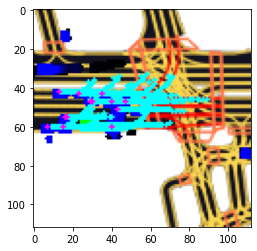

[[0.211942 0.576116 0.211942]]
[[0.21194519 0.57610965 0.21194519]]
[[0.2119422  0.57611555 0.2119422 ]]
[[0.21204732 0.5759053  0.21204732]]
[[0.21196209 0.57607585 0.21196209]]
[[0.21194576 0.5761085  0.21194576]]
[[0.21194516 0.5761097  0.21194516]]
[[0.21276425 0.57447153 0.21276425]]
[[0.21194227 0.5761154  0.21194227]]
[[0.21198793 0.5760242  0.21198793]]


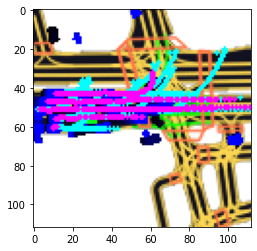

[[0.21194416 0.5761117  0.21194416]]
[[0.21194433 0.5761113  0.21194433]]
[[0.21194388 0.5761123  0.21194388]]
[[0.21194354 0.57611287 0.21194354]]
[[0.21194384 0.57611233 0.21194384]]
[[0.21194212 0.5761157  0.21194212]]
[[0.2133757  0.57324857 0.2133757 ]]
[[0.21235307 0.5752939  0.21235307]]


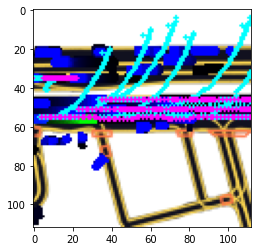

[[0.21194468 0.57611066 0.21194468]]
[[0.2119451  0.57610977 0.2119451 ]]
[[0.21194431 0.5761114  0.21194431]]
[[0.21194437 0.57611126 0.21194437]]
[[0.21194203 0.57611597 0.21194203]]
[[0.21194203 0.57611597 0.21194203]]
[[0.2120152  0.57596964 0.2120152 ]]
[[0.21194203 0.57611597 0.21194203]]


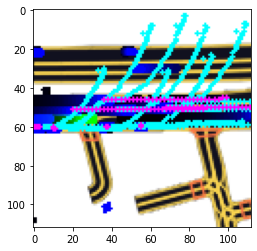

[[0.2119454 0.5761092 0.2119454]]
[[0.21194454 0.57611096 0.21194454]]
[[0.211945 0.57611  0.211945]]
[[0.21196142 0.57607716 0.21196142]]


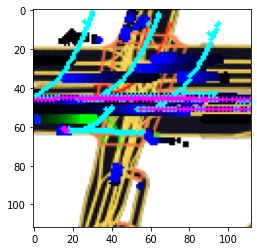

[[0.21194638 0.5761072  0.21194638]]
[[0.21194583 0.5761084  0.21194583]]


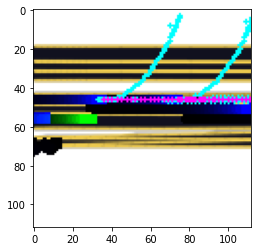

[[0.21194568 0.57610863 0.21194568]]
[[0.2119448 0.5761104 0.2119448]]
[[0.21194486 0.57611024 0.21194486]]
[[0.211944   0.57611203 0.211944  ]]
[[0.21194564 0.57610875 0.21194564]]
[[0.21409774 0.5718045  0.21409772]]
[[0.21206915 0.5758617  0.21206915]]
[[0.211977 0.576046 0.211977]]


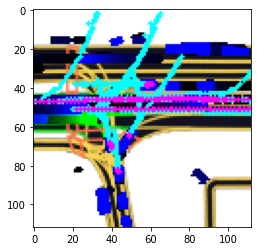

[[0.2119449 0.5761102 0.2119449]]
[[0.2119459 0.5761082 0.2119459]]
[[0.21194541 0.5761092  0.21194541]]
[[0.21194413 0.57611173 0.21194413]]
[[0.21194215 0.5761157  0.21194215]]
[[0.21280548 0.5743891  0.21280548]]
[[0.2122324 0.5755352 0.2122324]]
[[0.21242031 0.5751593  0.21242031]]


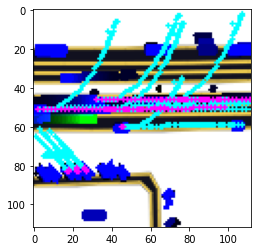

[[0.2119439 0.5761122 0.2119439]]
[[0.2119421 0.5761158 0.2119421]]
[[0.21194524 0.5761096  0.21194524]]
[[0.21194595 0.57610816 0.21194595]]
[[0.21194485 0.57611036 0.21194485]]


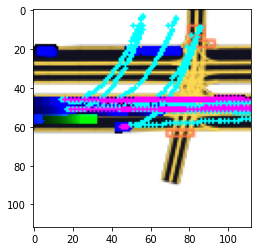

[[0.21194407 0.57611185 0.21194407]]
[[0.21194462 0.5761107  0.21194462]]
[[0.21194455 0.5761109  0.21194455]]
[[0.21194504 0.5761099  0.21194504]]
[[0.2119422  0.57611555 0.2119422 ]]
[[0.21194209 0.5761158  0.21194209]]
[[0.21194215 0.57611567 0.21194215]]
[[0.21194214 0.5761157  0.21194214]]


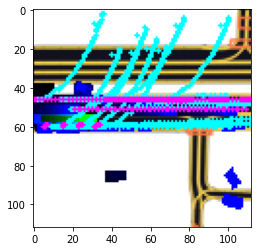

[[0.2119477  0.57610464 0.2119477 ]]
[[0.21194203 0.5761159  0.21194203]]
[[0.21313873 0.57372254 0.21313873]]
[[0.21213351 0.575733   0.21213351]]
[[0.21195625 0.5760875  0.21195625]]
[[0.21207887 0.57584226 0.21207887]]
[[0.21194215 0.5761157  0.21194215]]


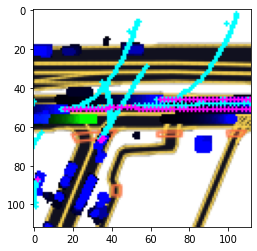

[[0.21194382 0.5761124  0.21194382]]
[[0.21194437 0.57611126 0.21194437]]


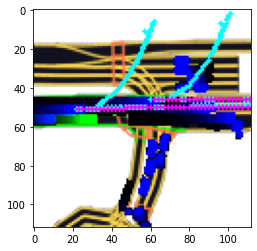

[[0.21194486 0.57611024 0.21194486]]
[[0.21200089 0.57599825 0.21200089]]


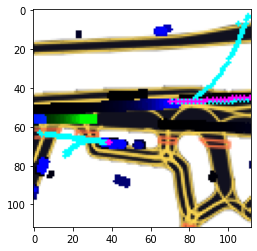

[[0.21263102 0.574738   0.21263102]]
[[0.21207437 0.5758513  0.21207437]]


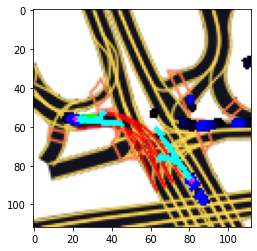

[[0.2122907 0.5754186 0.2122907]]
[[0.2119787 0.5760426 0.2119787]]
[[0.21194437 0.57611126 0.21194437]]
[[0.21308197 0.573836   0.21308197]]


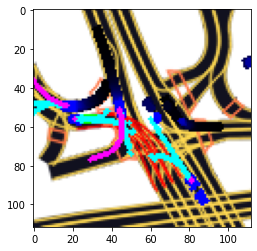

[[0.21236143 0.57527715 0.21236143]]
[[0.21199653 0.57600695 0.21199653]]
[[0.213546   0.57290804 0.21354598]]


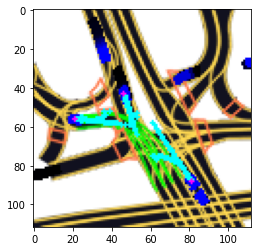

[[0.2119478 0.5761044 0.2119478]]
[[0.21200193 0.5759961  0.21200193]]
[[0.21245442 0.5750912  0.21245442]]


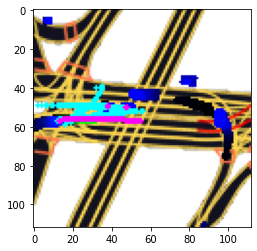

[[0.21576858 0.56846285 0.21576858]]
[[0.21198195 0.57603616 0.21198195]]
[[0.21194243 0.57611513 0.21194243]]
[[0.21476267 0.5704747  0.21476266]]
[[0.21194236 0.57611525 0.21194236]]
[[0.21194227 0.5761155  0.21194227]]


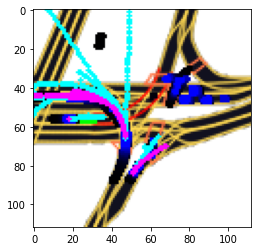

[[0.21227452 0.57545096 0.21227452]]
[[0.21197978 0.5760404  0.21197978]]
[[0.21231632 0.5753674  0.21231632]]


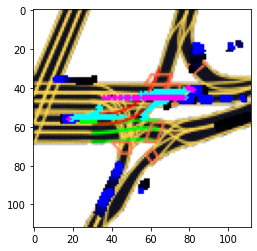

[[0.21303914 0.5739217  0.21303914]]
[[0.2119434 0.5761132 0.2119434]]
[[0.21194303 0.57611394 0.21194303]]
[[0.21201283 0.57597435 0.21201283]]
[[0.21194218 0.57611567 0.21194218]]
[[0.21194306 0.5761139  0.21194306]]
[[0.21194282 0.57611436 0.21194282]]
[[0.21194208 0.57611585 0.21194208]]


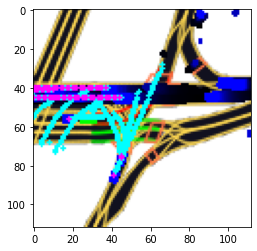

[[0.21328218 0.5734356  0.21328218]]
[[0.21195541 0.5760892  0.21195541]]
[[0.21194229 0.5761154  0.21194229]]
[[0.21194437 0.57611126 0.21194437]]


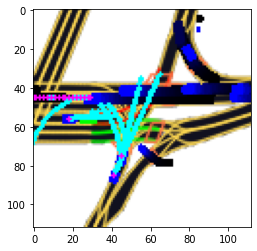

[[0.21194215 0.57611567 0.21194215]]
[[0.21202205 0.5759559  0.21202205]]
[[0.21194367 0.5761126  0.21194367]]
[[0.21194367 0.5761126  0.21194367]]
[[0.21194373 0.5761125  0.21194373]]
[[0.21194229 0.5761154  0.21194229]]
[[0.21194209 0.5761158  0.21194209]]


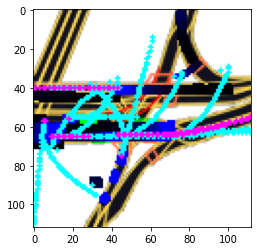

[[0.21197622 0.57604754 0.21197622]]
[[0.21209785 0.5758043  0.21209785]]
[[0.21194486 0.57611024 0.21194486]]


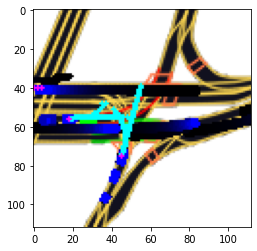

[[0.21194457 0.5761109  0.21194457]]
[[0.21195953 0.576081   0.21195953]]


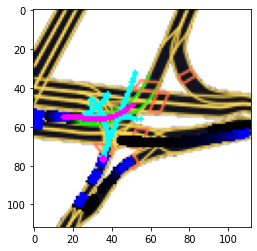

[[0.21194388 0.5761123  0.21194388]]
[[0.21194372 0.57611257 0.21194372]]
[[0.21194215 0.5761157  0.21194215]]


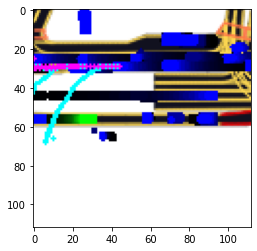

[[0.21557988 0.5688402  0.21557988]]
[[0.21433331 0.57133335 0.2143333 ]]
[[0.21217401 0.575652   0.21217401]]
[[0.21194215 0.5761157  0.21194215]]


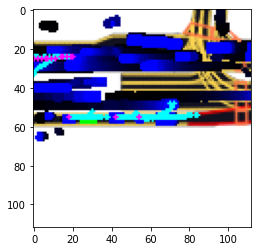

[[0.2119422 0.5761156 0.2119422]]
[[0.21202661 0.5759468  0.21202661]]
[[0.21215922 0.57568157 0.21215922]]
[[0.21194813 0.57610375 0.21194813]]


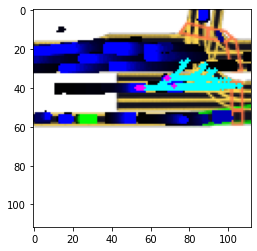

[[0.21194413 0.57611173 0.21194413]]
[[0.21194229 0.5761154  0.21194229]]
[[0.21225542 0.5754892  0.21225542]]
[[0.21272151 0.574557   0.21272151]]


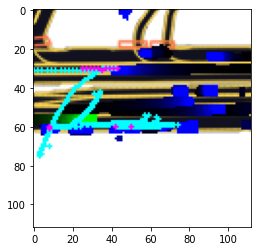

[[0.21194476 0.5761105  0.21194476]]
[[0.22171006 0.55657995 0.22171   ]]
[[0.21194212 0.5761157  0.21194212]]
[[0.2128401 0.5743198 0.2128401]]
[[0.21194234 0.5761153  0.21194234]]
[[0.21530803 0.569384   0.21530801]]
[[0.21194215 0.57611567 0.21194215]]
[[0.21195482 0.5760904  0.21195482]]
[[0.21435164 0.57129675 0.21435162]]
[[0.21216561 0.57566875 0.21216561]]
[[0.21194208 0.57611585 0.21194208]]


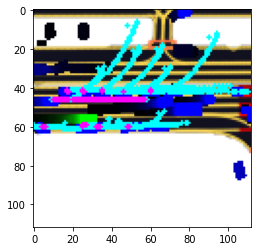

[[0.21322714 0.5735457  0.21322714]]
[[0.21231131 0.5753774  0.21231131]]
[[0.2156227 0.5687546 0.2156227]]
[[0.21323085 0.5735383  0.21323085]]
[[0.21201156 0.5759769  0.21201156]]
[[0.21202609 0.5759479  0.21202609]]
[[0.21200426 0.57599145 0.21200426]]
[[0.21194208 0.57611585 0.21194208]]


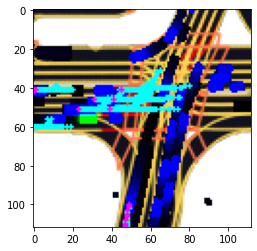

[[0.2120149 0.5759702 0.2120149]]
[[0.21202232 0.5759554  0.21202232]]
[[0.21233632 0.5753274  0.21233632]]
[[0.21291181 0.5741764  0.21291181]]
[[0.21194214 0.5761157  0.21194214]]
[[0.21195942 0.57608116 0.21195942]]
[[0.2122161  0.57556784 0.2122161 ]]
[[0.2167308  0.5665384  0.21673079]]
[[0.21391806 0.5721639  0.21391805]]
[[0.211942   0.57611597 0.211942  ]]


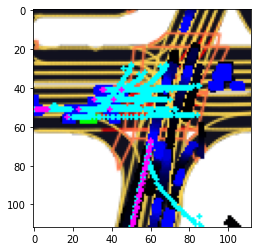

[[0.21418056 0.5716389  0.21418054]]
[[0.2120399  0.57592016 0.2120399 ]]
[[0.21382667 0.5723467  0.21382666]]
[[0.21380366 0.57239264 0.21380365]]
[[0.21217592 0.5756481  0.21217592]]
[[0.21201885 0.5759623  0.21201885]]
[[0.21195687 0.5760863  0.21195687]]
[[0.2193843  0.56123143 0.21938428]]
[[0.21196543 0.5760691  0.21196543]]
[[0.2159352  0.5681296  0.21593519]]


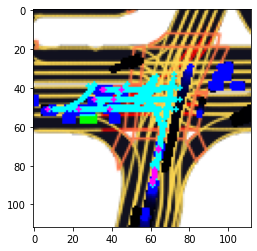

[[0.21261354 0.57477295 0.21261354]]
[[0.21199657 0.5760069  0.21199657]]
[[0.21361184 0.5727763  0.21361183]]
[[0.21269466 0.57461065 0.21269466]]
[[0.2119421 0.5761158 0.2119421]]
[[0.21200696 0.5759861  0.21200696]]
[[0.2119891 0.5760218 0.2119891]]
[[0.21196613 0.5760677  0.21196613]]
[[0.21526378 0.56947243 0.21526377]]
[[0.21461521 0.5707696  0.2146152 ]]
[[0.21198626 0.5760275  0.21198626]]
[[0.21194215 0.5761157  0.21194215]]


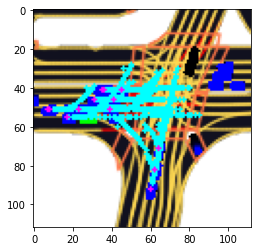

[[0.21233065 0.57533866 0.21233065]]
[[0.21200857 0.57598287 0.21200857]]
[[0.21516423 0.5696716  0.21516421]]
[[0.21240269 0.57519466 0.21240269]]
[[0.21195747 0.5760851  0.21195747]]
[[0.21404488 0.57191026 0.21404488]]
[[0.2120251 0.5759498 0.2120251]]
[[0.21194218 0.57611567 0.21194218]]
[[0.2119743 0.5760514 0.2119743]]
[[0.21196732 0.5760654  0.21196732]]
[[0.2119421 0.5761158 0.2119421]]
[[0.21194212 0.5761157  0.21194212]]
[[0.21194208 0.57611585 0.21194208]]
[[0.21582687 0.56834626 0.21582687]]


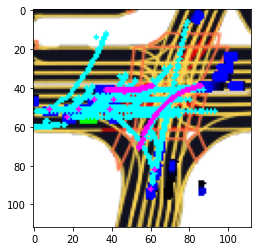

[[0.21201086 0.5759782  0.21201086]]
[[0.2125721 0.5748558 0.2125721]]
[[0.21218272 0.5756346  0.21218272]]
[[0.21196309 0.5760738  0.21196309]]
[[0.21227288 0.57545424 0.21227288]]
[[0.21297519 0.57404965 0.21297519]]
[[0.21195765 0.57608473 0.21195765]]
[[0.21194215 0.57611567 0.21194215]]
[[0.21194272 0.57611454 0.21194272]]
[[0.21194226 0.5761155  0.21194226]]
[[0.21194236 0.57611525 0.21194236]]


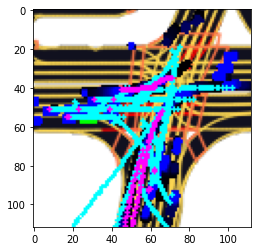

[[0.21215723 0.5756855  0.21215723]]
[[0.21250683 0.57498634 0.21250683]]
[[0.21216975 0.5756605  0.21216975]]
[[0.21305391 0.5738922  0.21305391]]
[[0.21330748 0.573385   0.21330748]]
[[0.21203278 0.57593447 0.21203278]]
[[0.21201672 0.57596654 0.21201672]]
[[0.21201368 0.5759726  0.21201368]]
[[0.21794306 0.5641139  0.21794303]]
[[0.21237974 0.5752405  0.21237974]]
[[0.21194391 0.57611215 0.21194391]]
[[0.21194825 0.57610345 0.21194825]]
[[0.2119814 0.5760372 0.2119814]]
[[0.21460772 0.5707846  0.21460772]]


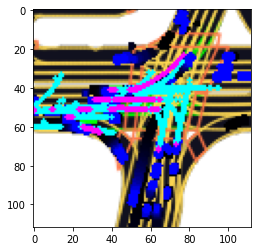

[[0.21194248 0.576115   0.21194248]]
[[0.21194299 0.57611406 0.21194299]]
[[0.21194425 0.57611144 0.21194425]]
[[0.21198654 0.5760269  0.21198654]]
[[0.21213429 0.5757314  0.21213429]]
[[0.21206504 0.5758699  0.21206504]]
[[0.21194226 0.5761155  0.21194226]]
[[0.2119422 0.5761156 0.2119422]]
[[0.21194203 0.5761159  0.21194203]]
[[0.2120362 0.5759276 0.2120362]]


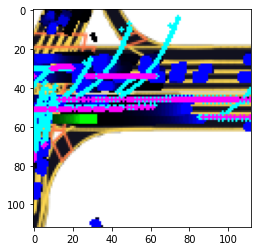

[[0.21194433 0.5761113  0.21194433]]
[[0.2119444 0.5761112 0.2119444]]
[[0.21194547 0.57610905 0.21194547]]
[[0.21438494 0.5712302  0.21438491]]
[[0.21674785 0.5665043  0.21674784]]


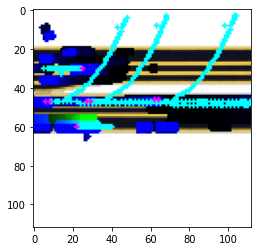

[[0.21194655 0.57610697 0.21194655]]


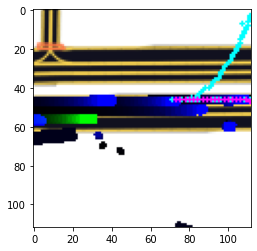

[[0.21194647 0.576107   0.21194647]]
[[0.21245015 0.5750997  0.21245015]]
[[0.21200152 0.575997   0.21200152]]


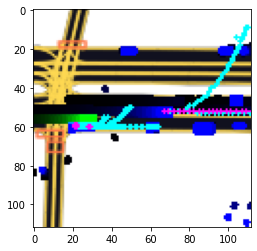

[[0.2129809  0.57403827 0.2129809 ]]
[[0.21194527 0.57610947 0.21194527]]
[[0.21194258 0.57611483 0.21194258]]
[[0.21233962 0.5753207  0.21233962]]
[[0.21735033 0.5652994  0.21735029]]


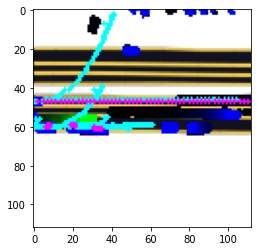

[[0.211945 0.57611  0.211945]]
[[0.21195695 0.57608604 0.21195695]]
[[0.21194264 0.5761147  0.21194264]]


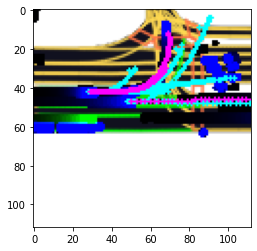

[[0.21194546 0.5761091  0.21194546]]
[[0.21194215 0.5761157  0.21194215]]


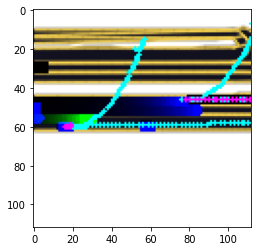

[[0.21194388 0.5761123  0.21194388]]
[[0.2120277 0.5759446 0.2120277]]
[[0.21442588 0.5711483  0.21442586]]
[[0.21528007 0.5694399  0.21528006]]
[[0.21338162 0.57323676 0.2133816 ]]
[[0.21402292 0.57195413 0.2140229 ]]


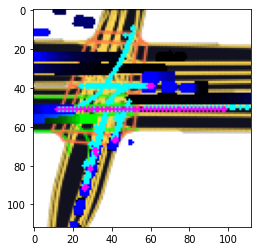

[[0.2119585 0.576083  0.2119585]]
[[0.21196024 0.5760795  0.21196024]]
[[0.21194454 0.57611096 0.21194454]]
[[0.21194577 0.57610846 0.21194577]]
[[0.21194412 0.5761118  0.21194412]]


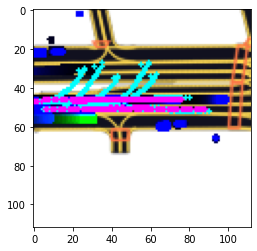

[[0.21250318 0.5749936  0.21250318]]
[[0.21210279 0.57579446 0.21210279]]
[[0.2129462 0.5741076 0.2129462]]
[[0.21195482 0.5760904  0.21195482]]
[[0.21212819 0.57574356 0.21212819]]
[[0.2119429  0.57611424 0.2119429 ]]
[[0.21194288 0.57611424 0.21194288]]
[[0.21198376 0.5760325  0.21198376]]
[[0.21205613 0.57588774 0.21205613]]
[[0.21200004 0.5759999  0.21200004]]
[[0.21194378 0.57611245 0.21194378]]


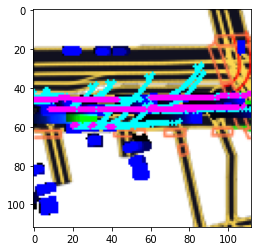

[[0.21375814 0.57248366 0.21375814]]
[[0.21194382 0.5761124  0.21194382]]
[[0.21194306 0.57611394 0.21194306]]
[[0.22296426 0.55407155 0.22296423]]
[[0.21194208 0.5761159  0.21194208]]
[[0.2119421 0.5761158 0.2119421]]
[[0.21196206 0.5760759  0.21196206]]
[[0.21375519 0.5724897  0.21375518]]
[[0.21194203 0.5761159  0.21194203]]


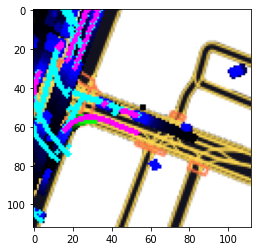

[[0.21194528 0.5761094  0.21194528]]


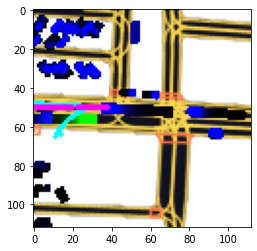

[[0.2120293 0.5759414 0.2120293]]
[[0.21195038 0.5760993  0.21195038]]
[[0.21403855 0.5719229  0.21403854]]
[[0.22437343 0.5512532  0.22437337]]


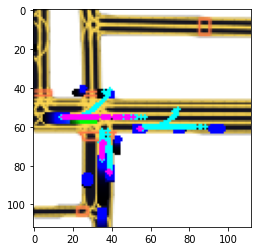

[[0.21202374 0.57595253 0.21202374]]


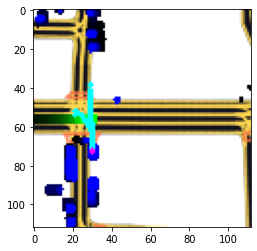

[[0.2119536 0.5760928 0.2119536]]
[[0.21210368 0.5757927  0.21210368]]
[[0.2135341  0.57293177 0.2135341 ]]


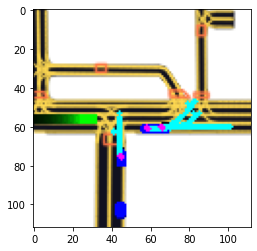

[[0.21194214 0.5761157  0.21194214]]
[[0.21293324 0.5741335  0.21293324]]
[[0.21332534 0.57334936 0.21332534]]


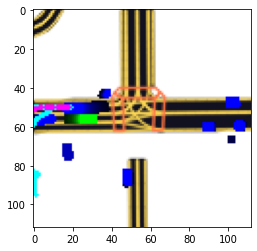

[[0.21228431 0.57543135 0.21228431]]
[[0.21458218 0.57083565 0.21458216]]
[[0.2134311 0.5731378 0.2134311]]
[[0.21218193 0.5756362  0.21218193]]


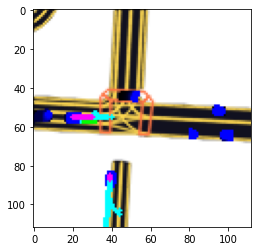

[[0.2119422 0.5761156 0.2119422]]


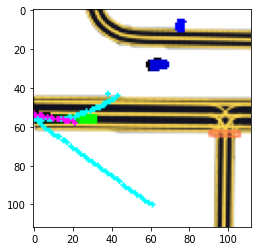

[[0.21194215 0.57611567 0.21194215]]


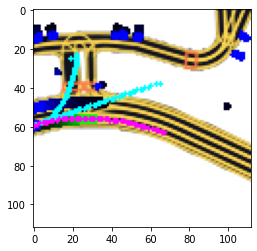

[[0.211942   0.57611597 0.211942  ]]


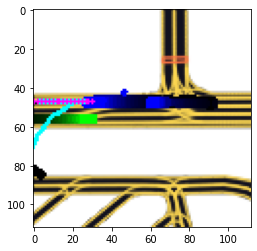

[[0.21194208 0.57611585 0.21194208]]


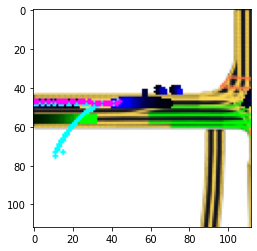

[[0.21195222 0.5760956  0.21195222]]


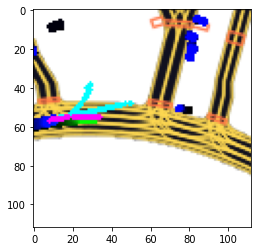

[[0.21194227 0.5761154  0.21194227]]
[[0.21194518 0.57610965 0.21194518]]


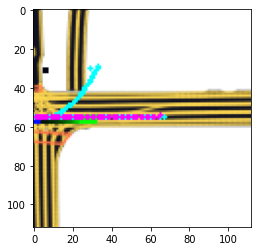

[[0.21194291 0.5761142  0.21194291]]
[[0.21194214 0.5761157  0.21194214]]


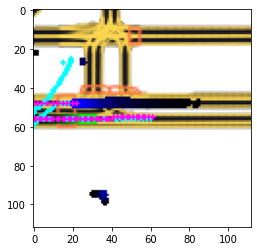

[[0.21199852 0.57600296 0.21199852]]


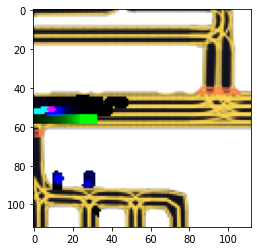

[[0.21194431 0.5761114  0.21194431]]


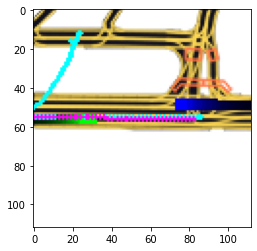

[[0.21194208 0.57611585 0.21194208]]


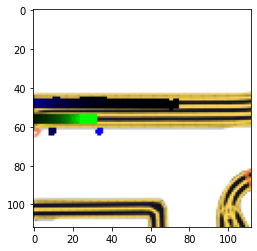

[[0.21194215 0.57611567 0.21194215]]


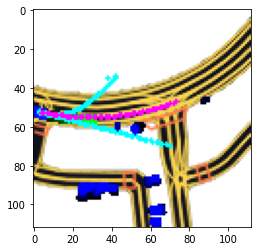

[[0.21194384 0.57611233 0.21194384]]


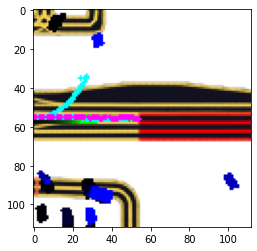

[[0.21491094 0.57017815 0.21491092]]
[[0.2129459 0.5741082 0.2129459]]
[[0.21194892 0.5761022  0.21194892]]
[[0.21194263 0.5761147  0.21194263]]
[[0.21194212 0.5761157  0.21194212]]
[[0.21195877 0.57608247 0.21195877]]


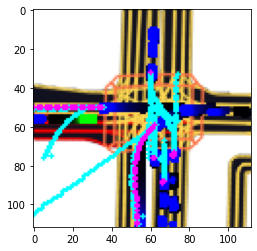

[[0.21281755 0.5743649  0.21281755]]
[[0.21452102 0.57095796 0.214521  ]]
[[0.21242875 0.57514256 0.21242875]]
[[0.21202819 0.57594365 0.21202819]]
[[0.21240854 0.5751829  0.21240854]]
[[0.21197341 0.57605314 0.21197341]]
[[0.21517557 0.56964886 0.21517554]]
[[0.21197368 0.57605267 0.21197368]]
[[0.21199264 0.57601476 0.21199264]]
[[0.21467702 0.5706459  0.214677  ]]


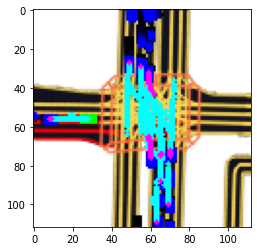

[[0.21247667 0.57504666 0.21247667]]
[[0.2119425 0.576115  0.2119425]]
[[0.21200074 0.57599854 0.21200074]]
[[0.21395417 0.57209164 0.21395417]]
[[0.21196097 0.57607806 0.21196097]]
[[0.21195446 0.5760911  0.21195446]]
[[0.21228668 0.5754266  0.21228668]]
[[0.21194224 0.57611555 0.21194224]]
[[0.21202852 0.57594293 0.21202852]]
[[0.21194224 0.57611555 0.21194224]]


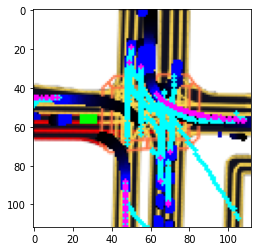

[[0.21313532 0.57372934 0.21313532]]
[[0.21294616 0.57410765 0.21294616]]
[[0.21194267 0.57611465 0.21194267]]
[[0.21608573 0.56782854 0.21608572]]
[[0.21194218 0.57611567 0.21194218]]
[[0.21194196 0.576116   0.21194196]]
[[0.21194215 0.5761157  0.21194215]]
[[0.21229136 0.5754173  0.21229136]]
[[0.21584581 0.5683084  0.21584576]]


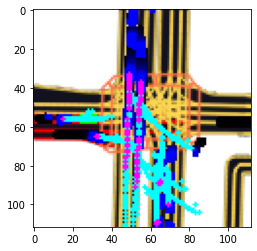

[[0.21295492 0.5740901  0.21295492]]
[[0.21732844 0.5653431  0.21732843]]
[[0.21194346 0.5761131  0.21194346]]
[[0.2119427 0.5761146 0.2119427]]
[[0.21194214 0.5761157  0.21194214]]


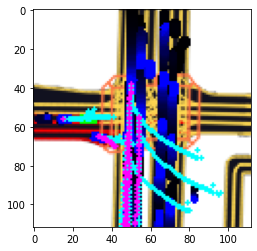

[[0.2120145 0.575971  0.2120145]]
[[0.21758187 0.56483626 0.21758184]]
[[0.22906496 0.5418702  0.22906488]]
[[0.21194215 0.57611567 0.21194215]]
[[0.21194218 0.57611567 0.21194218]]


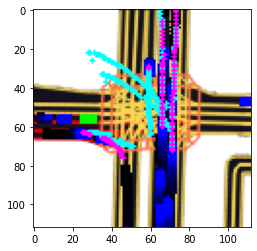

[[0.21272223 0.5745555  0.21272223]]
[[0.21202432 0.5759514  0.21202432]]
[[0.21198943 0.5760211  0.21198943]]


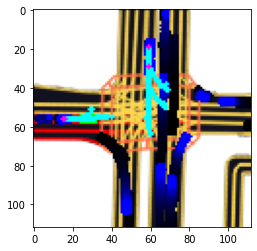

[[0.21195258 0.57609487 0.21195258]]
[[0.21196721 0.57606554 0.21196721]]
[[0.21219942 0.5756012  0.21219942]]
[[0.21433374 0.5713325  0.21433373]]


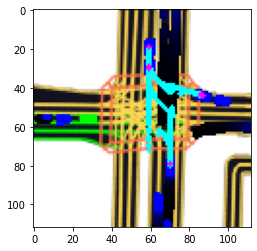

[[0.21194346 0.57611305 0.21194346]]


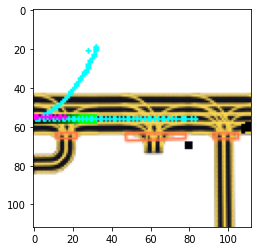

[[0.21194437 0.5761113  0.21194437]]
[[0.2123757  0.57524866 0.2123757 ]]
[[0.21701404 0.565972   0.21701401]]


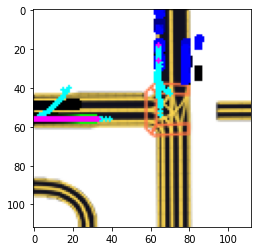

[[0.21949556 0.56100893 0.21949555]]
[[0.21212922 0.5757415  0.21212922]]
[[0.21387783 0.57224435 0.21387781]]
[[0.21627393 0.5674521  0.21627393]]
[[0.2133894  0.5732212  0.21338938]]
[[0.21215068 0.5756987  0.21215068]]
[[0.21194227 0.5761155  0.21194227]]
[[0.21622685 0.56754637 0.21622679]]


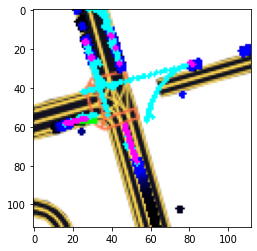

[[0.21194762 0.57610476 0.21194762]]


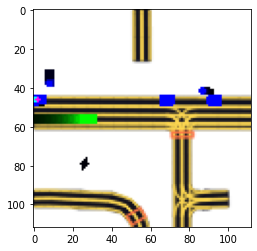

[[0.21241769 0.5751646  0.21241769]]
[[0.21194212 0.5761157  0.21194212]]
[[0.2119817  0.57603663 0.2119817 ]]
[[0.2119421 0.5761158 0.2119421]]
[[0.21195498 0.57609004 0.21195498]]


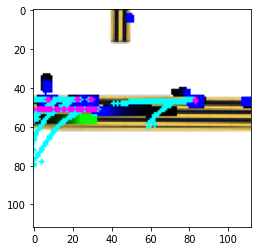

[[0.21194258 0.57611483 0.21194258]]
[[0.21200252 0.575995   0.21200252]]
[[0.21274653 0.57450694 0.21274653]]
[[0.21304844 0.5739031  0.21304844]]
[[0.21207923 0.57584155 0.21207923]]


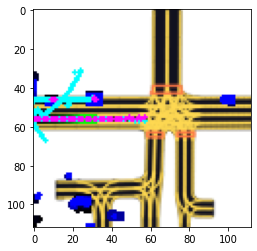

[[0.21760708 0.56478584 0.21760707]]
[[0.21367265 0.5726547  0.21367265]]
[[0.213691 0.572618 0.213691]]
[[0.21194203 0.57611597 0.21194203]]
[[0.22310886 0.5537823  0.22310881]]


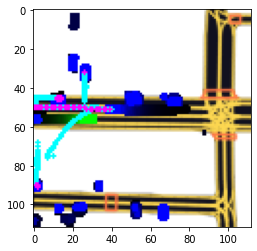

[[0.21230204 0.5753959  0.21230204]]
[[0.21313764 0.5737247  0.21313764]]
[[0.21257588 0.57484823 0.21257588]]
[[0.21308252 0.573835   0.21308252]]
[[0.21287173 0.5742566  0.21287173]]
[[0.21298511 0.57402974 0.21298511]]
[[0.21601762 0.5679648  0.21601759]]
[[0.21307428 0.57385147 0.21307428]]
[[0.22194578 0.5561085  0.22194573]]
[[0.21514429 0.5697114  0.21514428]]
[[0.21743116 0.5651377  0.21743114]]
[[0.21285972 0.57428056 0.21285972]]


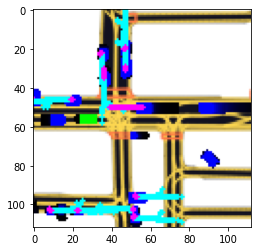

[[0.21297233 0.5740554  0.21297233]]
[[0.2133847  0.57323056 0.2133847 ]]
[[0.21268429 0.5746314  0.21268429]]
[[0.21208468 0.5758306  0.21208468]]
[[0.21448417 0.57103163 0.21448416]]
[[0.21333876 0.57332253 0.21333875]]
[[0.21218212 0.5756358  0.21218212]]
[[0.21195143 0.57609713 0.21195143]]


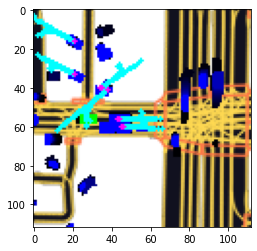

[[0.21217261 0.57565475 0.21217261]]
[[0.21540913 0.5691818  0.2154091 ]]
[[0.21265152 0.57469696 0.21265152]]
[[0.21201241 0.57597524 0.21201241]]
[[0.2121698 0.5756604 0.2121698]]
[[0.21746714 0.56506574 0.21746713]]
[[0.21299283 0.5740143  0.21299283]]
[[0.21221565 0.57556874 0.21221565]]
[[0.21204412 0.5759117  0.21204412]]
[[0.21203575 0.5759285  0.21203575]]


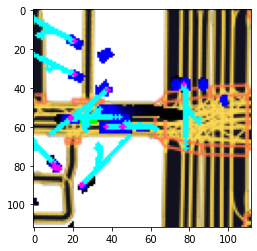

[[0.21344537 0.57310927 0.21344537]]
[[0.2120443 0.5759114 0.2120443]]
[[0.21222575 0.5755485  0.21222575]]
[[0.21574771 0.5685046  0.21574771]]
[[0.21258593 0.57482815 0.21258593]]
[[0.21244277 0.5751145  0.21244277]]
[[0.21417384 0.57165235 0.21417382]]
[[0.212051   0.57589805 0.212051  ]]
[[0.21195327 0.57609344 0.21195327]]
[[0.21198612 0.57602775 0.21198612]]
[[0.21202607 0.5759479  0.21202607]]
[[0.2119421 0.5761158 0.2119421]]


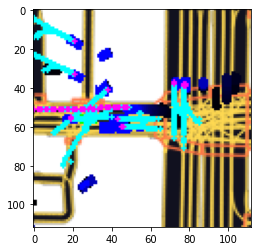

[[0.21574719 0.56850564 0.21574718]]
[[0.21295127 0.57409745 0.21295127]]
[[0.21246463 0.5750708  0.21246463]]
[[0.21208473 0.5758306  0.21208473]]
[[0.21195568 0.5760886  0.21195568]]
[[0.2119422  0.57611555 0.2119422 ]]


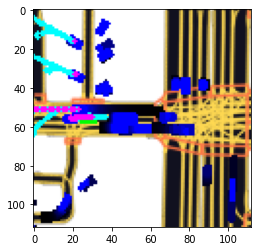

[[0.21293601 0.574128   0.21293601]]
[[0.21214962 0.57570076 0.21214962]]
[[0.21381459 0.57237077 0.21381459]]
[[0.2119429  0.57611424 0.2119429 ]]
[[0.21273935 0.57452136 0.21273935]]
[[0.21274842 0.5745032  0.21274842]]
[[0.21221748 0.57556504 0.21221748]]
[[0.21227208 0.5754558  0.21227208]]
[[0.21198346 0.5760331  0.21198346]]
[[0.2120762  0.57584757 0.2120762 ]]
[[0.21217695 0.57564604 0.21217695]]


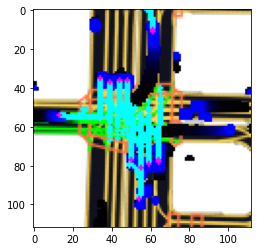

[[0.21367861 0.5726428  0.21367858]]
[[0.21213712 0.5757258  0.21213712]]
[[0.21203285 0.57593435 0.21203285]]
[[0.21196908 0.57606184 0.21196908]]
[[0.21211448 0.575771   0.21211448]]
[[0.21197325 0.5760535  0.21197325]]
[[0.21195556 0.57608885 0.21195556]]
[[0.21194342 0.5761132  0.21194342]]


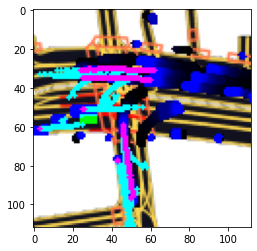

[[0.21194234 0.5761153  0.21194234]]
[[0.21194239 0.57611525 0.21194239]]
[[0.21200798 0.57598406 0.21200798]]
[[0.21586055 0.5682789  0.21586053]]
[[0.21240558 0.5751888  0.21240558]]
[[0.21197332 0.5760533  0.21197332]]
[[0.21196277 0.5760744  0.21196277]]
[[0.21732229 0.5653555  0.21732226]]
[[0.21194302 0.576114   0.21194302]]


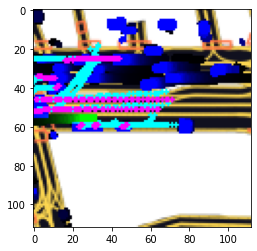

[[0.21195683 0.5760864  0.21195683]]
[[0.2119498 0.5761004 0.2119498]]
[[0.21217573 0.5756485  0.21217573]]
[[0.21201889 0.5759622  0.21201889]]
[[0.21194312 0.57611376 0.21194312]]
[[0.21194212 0.5761157  0.21194212]]
[[0.21194956 0.5761009  0.21194956]]
[[0.2119422 0.5761156 0.2119422]]


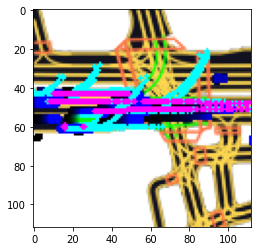

[[0.2119437 0.5761126 0.2119437]]
[[0.2119434 0.5761132 0.2119434]]
[[0.21194382 0.5761124  0.21194382]]
[[0.21210733 0.57578534 0.21210733]]
[[0.21238586 0.5752283  0.21238586]]
[[0.21234089 0.5753182  0.21234089]]
[[0.21279733 0.5744053  0.21279733]]
[[0.21667671 0.5666466  0.2166767 ]]


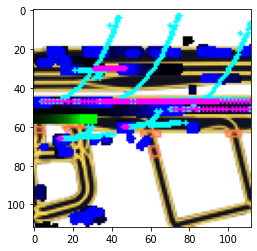

[[0.21194524 0.57610947 0.21194524]]
[[0.21194513 0.5761097  0.21194513]]
[[0.2119437  0.57611257 0.2119437 ]]
[[0.21194214 0.5761157  0.21194214]]
[[0.21194233 0.5761153  0.21194233]]
[[0.21194215 0.5761157  0.21194215]]
[[0.21194209 0.5761158  0.21194209]]
[[0.21194223 0.57611555 0.21194223]]


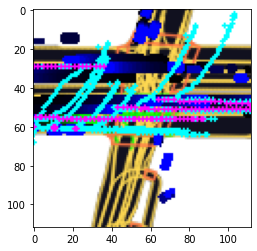

[[0.2119454 0.5761092 0.2119454]]
[[0.21194544 0.5761091  0.21194544]]
[[0.21194509 0.57610977 0.21194509]]
[[0.21194449 0.57611096 0.21194449]]


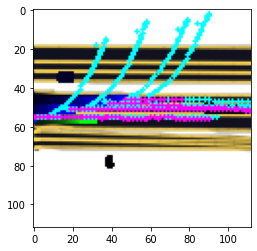

[[0.21194461 0.57611084 0.21194461]]
[[0.21194437 0.5761113  0.21194437]]
[[0.2119447 0.5761106 0.2119447]]
[[0.21194468 0.57611066 0.21194468]]
[[0.21194571 0.5761086  0.21194571]]
[[0.21229549 0.575409   0.21229549]]
[[0.21196176 0.5760765  0.21196176]]


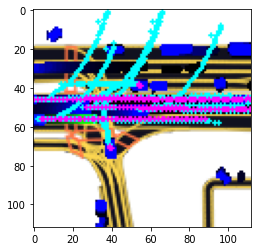

[[0.21194303 0.57611394 0.21194303]]
[[0.21194306 0.5761139  0.21194306]]
[[0.21194302 0.576114   0.21194302]]
[[0.2119443  0.57611144 0.2119443 ]]
[[0.21196368 0.57607263 0.21196368]]


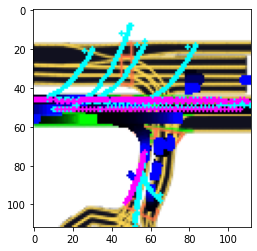

[[0.21197207 0.5760558  0.21197207]]
[[0.21194832 0.5761034  0.21194832]]
[[0.21194279 0.5761144  0.21194279]]
[[0.21194445 0.5761111  0.21194445]]
[[0.21204743 0.57590514 0.21204743]]


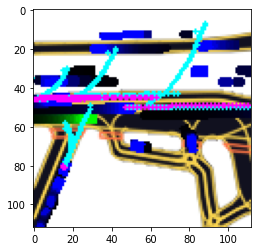

[[0.21218413 0.57563174 0.21218413]]
[[0.21202166 0.5759567  0.21202166]]
[[0.21219467 0.5756107  0.21219467]]
[[0.21245423 0.57509154 0.21245423]]
[[0.21205616 0.5758877  0.21205616]]
[[0.21196355 0.57607293 0.21196355]]
[[0.21202275 0.5759545  0.21202275]]
[[0.21197137 0.57605726 0.21197137]]
[[0.21197294 0.57605416 0.21197294]]
[[0.21200545 0.5759891  0.21200545]]
[[0.21194236 0.57611525 0.21194236]]
[[0.2119444 0.5761112 0.2119444]]
[[0.21194208 0.5761159  0.21194208]]
[[0.21194199 0.576116   0.21194199]]
[[0.21195291 0.57609415 0.21195291]]


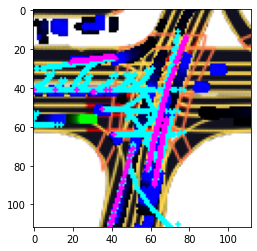

[[0.21305971 0.5738806  0.21305971]]
[[0.21212244 0.5757551  0.21212244]]
[[0.21194209 0.5761158  0.21194209]]
[[0.2129195 0.574161  0.2129195]]
[[0.21194445 0.5761111  0.21194445]]
[[0.21238348 0.57523304 0.21238348]]
[[0.2124975 0.575005  0.2124975]]
[[0.21276037 0.5744792  0.21276037]]
[[0.2119501 0.5760998 0.2119501]]
[[0.21195014 0.57609975 0.21195014]]
[[0.21195363 0.5760927  0.21195363]]
[[0.21195519 0.5760896  0.21195519]]
[[0.21194693 0.57610613 0.21194693]]
[[0.21194397 0.5761121  0.21194397]]
[[0.21196152 0.576077   0.21196152]]
[[0.21194212 0.5761157  0.21194212]]


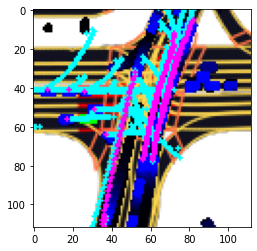

[[0.214815   0.57037    0.21481499]]
[[0.21194653 0.57610697 0.21194653]]
[[0.21196553 0.57606894 0.21196553]]
[[0.21219186 0.5756163  0.21219186]]
[[0.21194215 0.5761157  0.21194215]]


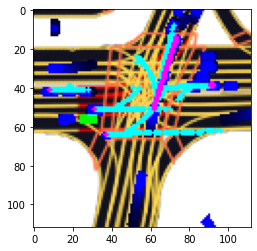

[[0.21221301 0.575574   0.21221301]]
[[0.21208733 0.5758253  0.21208733]]
[[0.21220443 0.57559115 0.21220443]]
[[0.21287727 0.5742454  0.21287727]]
[[0.21195383 0.5760923  0.21195383]]
[[0.21277197 0.57445604 0.21277197]]
[[0.21211036 0.5757793  0.21211036]]
[[0.2119666  0.57606673 0.2119666 ]]
[[0.21200424 0.5759915  0.21200424]]


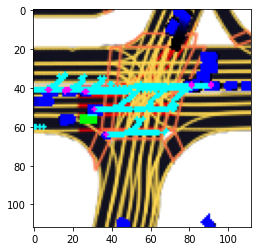

[[0.21258706 0.5748259  0.21258706]]
[[0.21200001 0.576      0.21200001]]
[[0.21197224 0.5760555  0.21197224]]
[[0.2120359  0.57592815 0.2120359 ]]
[[0.21196805 0.57606393 0.21196805]]
[[0.21261385 0.57477236 0.21261385]]
[[0.21208504 0.57582986 0.21208504]]
[[0.21197875 0.5760425  0.21197875]]
[[0.21196032 0.57607937 0.21196032]]
[[0.2120903  0.57581943 0.2120903 ]]
[[0.21236032 0.5752793  0.21236032]]
[[0.2138033  0.5723934  0.21380329]]
[[0.21260881 0.5747824  0.21260881]]


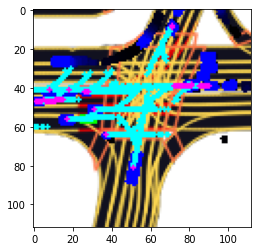

[[0.21200727 0.5759855  0.21200727]]
[[0.21211365 0.57577264 0.21211365]]
[[0.21199144 0.5760171  0.21199144]]
[[0.21194257 0.57611483 0.21194257]]
[[0.21194279 0.5761144  0.21194279]]
[[0.21196297 0.576074   0.21196297]]
[[0.21198764 0.5760247  0.21198764]]
[[0.21197867 0.5760427  0.21197867]]
[[0.21194263 0.5761148  0.21194263]]
[[0.21210271 0.5757946  0.21210271]]
[[0.21194208 0.57611585 0.21194208]]
[[0.21239002 0.5752199  0.21239002]]


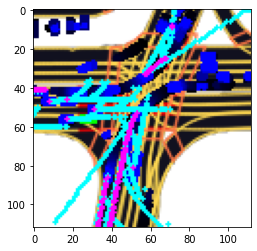

[[0.2123271 0.5753458 0.2123271]]
[[0.21206404 0.5758719  0.21206404]]
[[0.21220839 0.57558316 0.21220839]]
[[0.21194279 0.57611436 0.21194279]]
[[0.21202601 0.575948   0.21202601]]
[[0.21204598 0.57590806 0.21204598]]
[[0.21194294 0.57611406 0.21194294]]
[[0.21194282 0.57611436 0.21194282]]
[[0.21194309 0.5761138  0.21194309]]
[[0.21196316 0.57607365 0.21196316]]
[[0.21208689 0.5758262  0.21208689]]
[[0.21194425 0.57611144 0.21194425]]


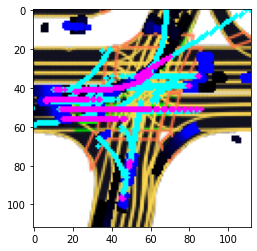

[[0.21343246 0.5731351  0.21343246]]
[[0.21245094 0.57509816 0.21245094]]
[[0.21219568 0.5756086  0.21219568]]
[[0.21194215 0.5761157  0.21194215]]
[[0.21194209 0.5761158  0.21194209]]
[[0.2161494  0.5677012  0.21614936]]
[[0.21299787 0.5740043  0.21299787]]
[[0.21194218 0.57611567 0.21194218]]
[[0.21194214 0.5761157  0.21194214]]
[[0.2119422  0.57611555 0.2119422 ]]


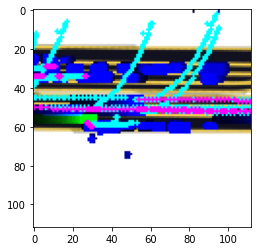

[[0.21194516 0.5761097  0.21194516]]
[[0.21194214 0.5761157  0.21194214]]
[[0.21212472 0.5757505  0.21212472]]
[[0.21194208 0.57611585 0.21194208]]


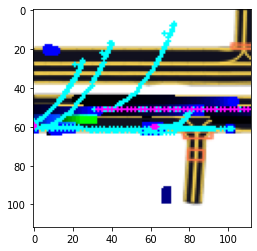

[[0.21194564 0.57610875 0.21194564]]
[[0.21194535 0.57610935 0.21194535]]
[[0.21194457 0.5761109  0.21194457]]
[[0.211966   0.57606804 0.211966  ]]
[[0.21222904 0.5755419  0.21222904]]


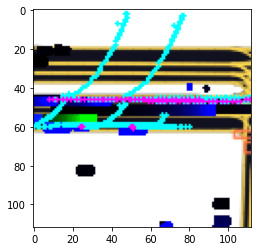

[[0.21194509 0.57610977 0.21194509]]
[[0.21194497 0.57611006 0.21194497]]
[[0.21194449 0.576111   0.21194449]]
[[0.2119422  0.57611555 0.2119422 ]]


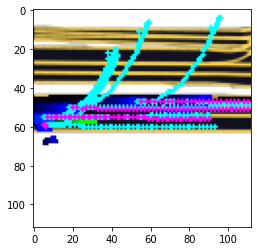

[[0.21194397 0.57611203 0.21194397]]
[[0.21194583 0.5761083  0.21194583]]
[[0.21194215 0.5761157  0.21194215]]


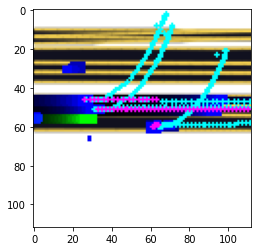

[[0.21194208 0.5761159  0.21194208]]
[[0.21194208 0.5761159  0.21194208]]
[[0.21221715 0.57556564 0.21221715]]
[[0.21194214 0.5761157  0.21194214]]
[[0.212255 0.57549  0.212255]]
[[0.21194215 0.57611567 0.21194215]]
[[0.21194214 0.5761157  0.21194214]]


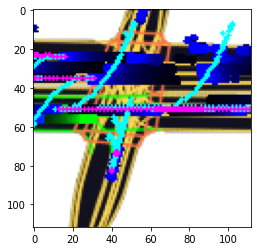

[[0.2119448 0.5761104 0.2119448]]
[[0.21194418 0.5761117  0.21194418]]
[[0.21194412 0.5761118  0.21194412]]
[[0.21343534 0.57312936 0.21343534]]
[[0.21207996 0.57584006 0.21207996]]
[[0.21417555 0.5716489  0.21417554]]
[[0.21194218 0.57611567 0.21194218]]


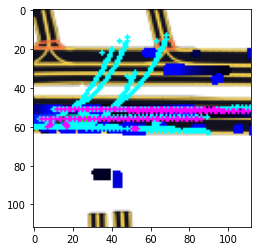

[[0.21194382 0.5761124  0.21194382]]
[[0.21194346 0.57611305 0.21194346]]
[[0.21194212 0.5761157  0.21194212]]
[[0.2119421 0.5761158 0.2119421]]
[[0.21194209 0.5761158  0.21194209]]
[[0.2124934  0.57501316 0.2124934 ]]


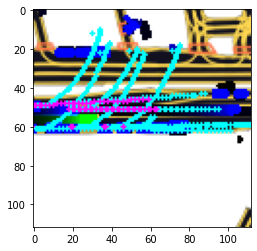

[[0.21194498 0.57611    0.21194498]]
[[0.21194364 0.57611275 0.21194364]]
[[0.21200567 0.57598865 0.21200567]]
[[0.21200643 0.57598716 0.21200643]]
[[0.2130447 0.5739106 0.2130447]]


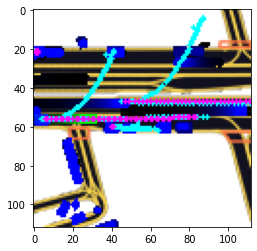

[[0.2119437 0.5761126 0.2119437]]
[[0.21201447 0.57597107 0.21201447]]
[[0.21194391 0.57611215 0.21194391]]
[[0.21217588 0.57564825 0.21217588]]
[[0.21379729 0.57240546 0.21379729]]
[[0.21199204 0.57601595 0.21199204]]
[[0.21619463 0.5676108  0.21619458]]
[[0.21212648 0.5757471  0.21212648]]
[[0.21239686 0.5752063  0.21239686]]


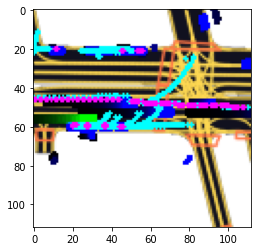

[[0.21216486 0.5756703  0.21216486]]
[[0.21204282 0.5759143  0.21204282]]
[[0.2121843 0.5756314 0.2121843]]
[[0.21395548 0.5720891  0.21395546]]
[[0.21470855 0.57058287 0.21470855]]
[[0.21391523 0.57216954 0.21391523]]


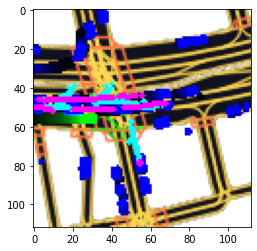

[[0.21194354 0.5761129  0.21194354]]
[[0.2119426 0.5761148 0.2119426]]
[[0.21194358 0.57611287 0.21194358]]
[[0.21194279 0.5761144  0.21194279]]
[[0.21194373 0.5761125  0.21194373]]
[[0.21194203 0.57611597 0.21194203]]
[[0.21194212 0.5761157  0.21194212]]


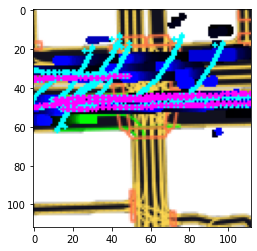

[[0.21559073 0.56881857 0.21559072]]
[[0.21197076 0.5760585  0.21197076]]
[[0.21226513 0.57546973 0.21226513]]
[[0.21196316 0.57607365 0.21196316]]


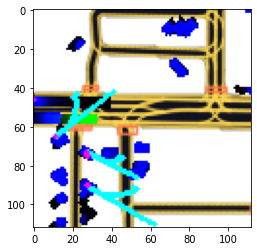

[[0.21194275 0.5761145  0.21194275]]
[[0.2119611 0.5760778 0.2119611]]
[[0.21450277 0.5709945  0.21450277]]


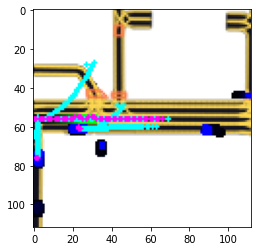

[[0.21256724 0.5748655  0.21256724]]
[[0.21280752 0.574385   0.21280752]]


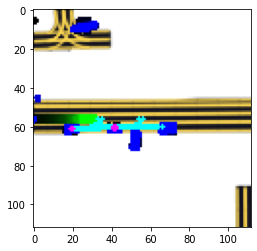

[[0.21194607 0.5761079  0.21194607]]
[[0.21378091 0.57243824 0.2137809 ]]
[[0.2151153  0.56976944 0.21511528]]
[[0.21194227 0.5761154  0.21194227]]
[[0.21301009 0.5739798  0.21301009]]


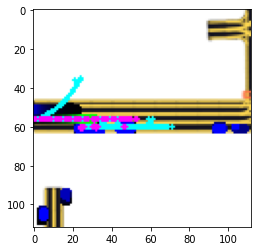

[[0.21194258 0.57611483 0.21194258]]


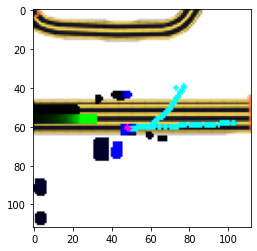

[[0.21572457 0.5685509  0.21572456]]
[[0.21222466 0.5755507  0.21222466]]
[[0.2128256 0.5743488 0.2128256]]
[[0.21211804 0.5757639  0.21211804]]
[[0.21254097 0.5749181  0.21254097]]
[[0.21194468 0.5761106  0.21194468]]
[[0.2124526 0.5750948 0.2124526]]


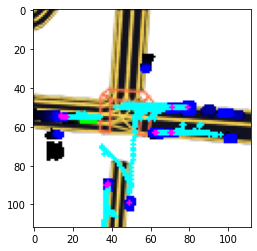

[[0.21194215 0.57611567 0.21194215]]
[[0.21209726 0.5758055  0.21209726]]
[[0.21728863 0.5654228  0.21728858]]
[[0.21236981 0.5752604  0.21236981]]


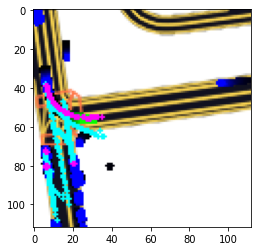

[[0.21195322 0.57609355 0.21195322]]


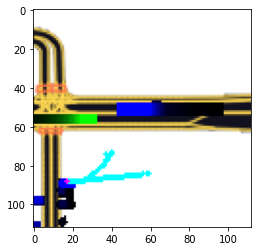

[[0.2123357 0.5753286 0.2123357]]


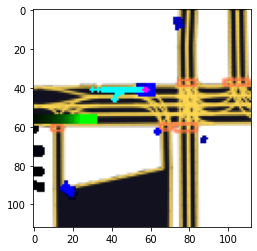

[[0.2119435 0.576113  0.2119435]]


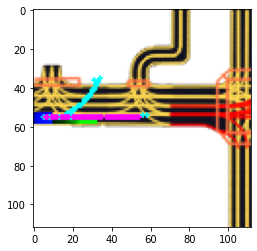

[[0.2119421 0.5761158 0.2119421]]


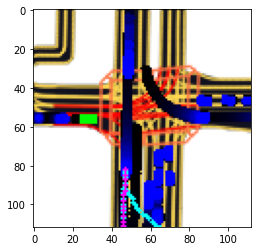

[[0.21638028 0.56723946 0.21638025]]
[[0.21202561 0.5759487  0.21202561]]
[[0.212173 0.575654 0.212173]]
[[0.21202365 0.5759527  0.21202365]]
[[0.21208456 0.57583094 0.21208456]]
[[0.21207856 0.5758429  0.21207856]]
[[0.21381332 0.5723734  0.21381332]]
[[0.2161151  0.5677698  0.21611509]]
[[0.21553457 0.56893086 0.21553455]]
[[0.21912888 0.56174225 0.21912885]]


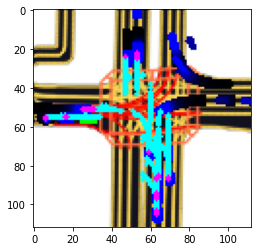

[[0.21358383 0.57283235 0.21358383]]
[[0.21197942 0.5760412  0.21197942]]
[[0.2124925 0.575015  0.2124925]]
[[0.21198776 0.5760245  0.21198776]]
[[0.21207577 0.57584846 0.21207577]]
[[0.21213393 0.5757322  0.21213393]]
[[0.21205124 0.5758975  0.21205124]]
[[0.21225671 0.57548654 0.21225671]]
[[0.21208401 0.575832   0.21208401]]
[[0.211944   0.57611203 0.211944  ]]
[[0.21472344 0.5705531  0.21472342]]


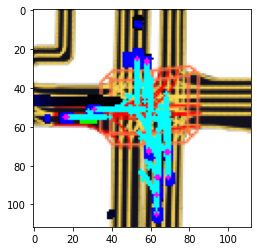

[[0.21194418 0.5761117  0.21194418]]


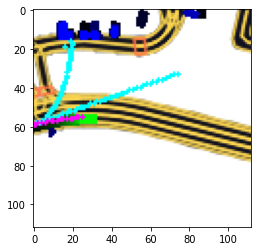

[[0.21194403 0.5761119  0.21194403]]


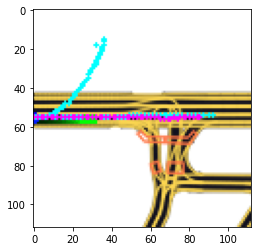

[[0.21194579 0.57610846 0.21194579]]
[[0.21243514 0.57512975 0.21243514]]


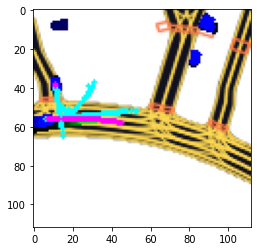

[[0.21196127 0.57607746 0.21196127]]


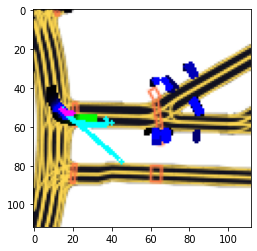

[[0.21194224 0.57611555 0.21194224]]
[[0.2119421 0.5761158 0.2119421]]


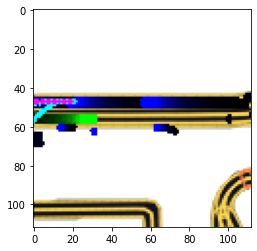

[[0.21194288 0.57611424 0.21194288]]
[[0.21194203 0.57611597 0.21194203]]
[[0.21194232 0.5761153  0.21194232]]


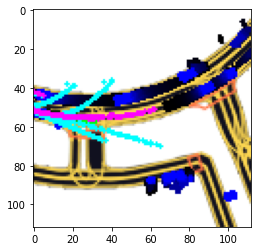

[[0.211947 0.576106 0.211947]]
[[0.21194269 0.5761146  0.21194269]]
[[0.21195254 0.5760949  0.21195254]]


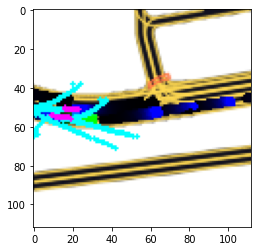

[[0.21195896 0.5760821  0.21195896]]


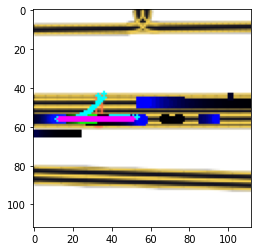

[[0.21194838 0.5761032  0.21194838]]
[[0.2119483 0.5761034 0.2119483]]


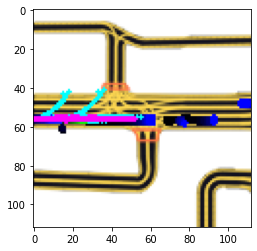

[[0.21582226 0.5683555  0.21582223]]
[[0.21734817 0.5653037  0.21734816]]
[[0.21195355 0.57609296 0.21195355]]
[[0.21472658 0.5705468  0.21472657]]
[[0.2135746  0.57285076 0.21357459]]
[[0.21243396 0.5751321  0.21243396]]
[[0.21233304 0.57533395 0.21233304]]
[[0.21295342 0.57409316 0.21295342]]


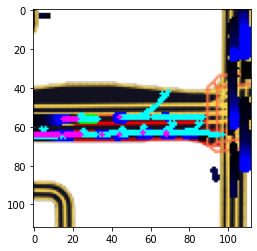

[[0.21635826 0.5672835  0.21635824]]
[[0.21481754 0.57036495 0.21481751]]
[[0.21196277 0.5760744  0.21196277]]
[[0.21624711 0.5675058  0.2162471 ]]
[[0.21555465 0.5688907  0.21555465]]
[[0.21397257 0.5720549  0.21397255]]
[[0.21522087 0.56955826 0.21522087]]
[[0.2153786  0.56924284 0.21537857]]
[[0.22409381 0.5518124  0.22409375]]


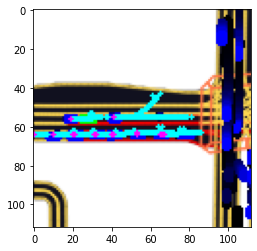

[[0.21466349 0.570673   0.21466348]]
[[0.21458013 0.57083976 0.21458012]]
[[0.21200444 0.5759911  0.21200444]]
[[0.21524979 0.56950045 0.21524978]]
[[0.22048782 0.5590244  0.22048779]]
[[0.21758577 0.56482846 0.21758576]]
[[0.21701184 0.5659763  0.21701182]]
[[0.21567829 0.56864345 0.21567827]]
[[0.21242906 0.57514185 0.21242906]]
[[0.21194263 0.5761147  0.21194263]]


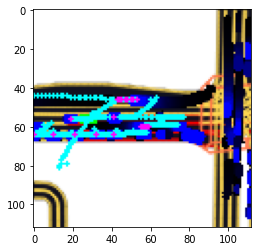

[[0.21426535 0.5714693  0.21426533]]
[[0.21833958 0.5633209  0.21833956]]
[[0.21948151 0.561037   0.21948148]]
[[0.2172929  0.5654142  0.21729289]]
[[0.21749943 0.5650012  0.21749938]]
[[0.21266484 0.5746703  0.21266484]]
[[0.21244504 0.5751099  0.21244504]]
[[0.21592389 0.5681522  0.21592389]]
[[0.21204501 0.57591    0.21204501]]
[[0.22172831 0.5565434  0.22172827]]
[[0.21655522 0.5668896  0.21655521]]
[[0.21735783 0.5652844  0.2173578 ]]


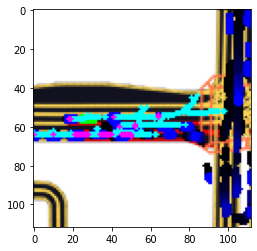

[[0.2144908  0.5710184  0.21449079]]
[[0.21965697 0.5606861  0.21965693]]
[[0.21281731 0.5743653  0.21281731]]
[[0.21552187 0.5689563  0.21552186]]
[[0.21857324 0.5628535  0.2185732 ]]
[[0.21543887 0.56912225 0.21543887]]
[[0.2147014  0.57059723 0.2147014 ]]
[[0.21236052 0.57527894 0.21236052]]
[[0.21308951 0.573821   0.21308951]]
[[0.21652232 0.5669554  0.2165223 ]]
[[0.22141649 0.55716705 0.22141646]]
[[0.215382   0.56923604 0.215382  ]]


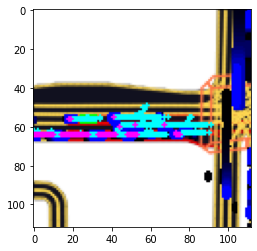

[[0.21315846 0.5736831  0.21315846]]
[[0.21229276 0.57541454 0.21229276]]
[[0.21528447 0.56943107 0.21528445]]
[[0.21261886 0.5747623  0.21261886]]
[[0.21195786 0.5760843  0.21195786]]
[[0.2158652  0.56826967 0.21586516]]
[[0.21194252 0.57611495 0.21194252]]
[[0.21401702 0.571966   0.21401699]]
[[0.2136071 0.5727858 0.2136071]]
[[0.21232922 0.5753415  0.21232922]]
[[0.21194218 0.57611567 0.21194218]]


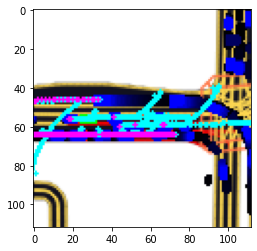

[[0.21392953 0.57214093 0.21392952]]
[[0.21296188 0.5740762  0.21296188]]
[[0.21194884 0.5761024  0.21194884]]
[[0.21248397 0.57503206 0.21248397]]
[[0.21194631 0.57610744 0.21194631]]
[[0.21488479 0.5702305  0.21488479]]
[[0.21930543 0.5613892  0.2193054 ]]
[[0.21350801 0.572984   0.21350801]]
[[0.2143924  0.5712152  0.21439238]]
[[0.2119437 0.5761126 0.2119437]]
[[0.22039033 0.55921936 0.2203903 ]]
[[0.21549782 0.56900436 0.2154978 ]]
[[0.21194203 0.5761159  0.21194203]]


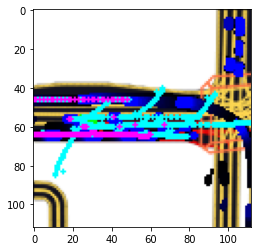

[[0.2143715  0.57125705 0.2143715 ]]
[[0.21241803 0.5751639  0.21241803]]
[[0.21218008 0.57563984 0.21218008]]
[[0.21297607 0.57404786 0.21297607]]
[[0.21266705 0.57466596 0.21266705]]
[[0.21592082 0.5681583  0.2159208 ]]
[[0.21288091 0.5742382  0.21288091]]
[[0.21440819 0.5711836  0.21440819]]
[[0.21482594 0.5703481  0.21482593]]
[[0.21194382 0.5761124  0.21194382]]
[[0.2119433  0.57611334 0.2119433 ]]


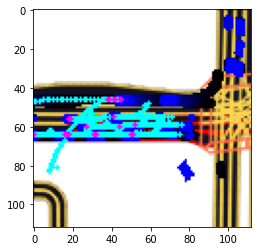

[[0.21573667 0.5685267  0.21573666]]
[[0.21467021 0.5706596  0.2146702 ]]
[[0.21203974 0.5759205  0.21203974]]
[[0.2119577 0.5760846 0.2119577]]
[[0.21196355 0.57607293 0.21196355]]
[[0.21215518 0.5756897  0.21215518]]


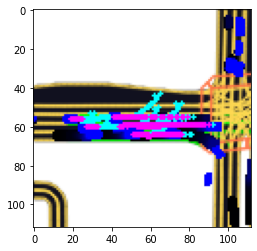

[[0.21215661 0.5756868  0.21215661]]
[[0.21229896 0.575402   0.21229896]]
[[0.21212183 0.5757563  0.21212183]]
[[0.21292391 0.5741522  0.21292391]]
[[0.21202855 0.57594293 0.21202855]]
[[0.2121052  0.57578963 0.2121052 ]]
[[0.2120913 0.5758174 0.2120913]]
[[0.21218492 0.5756302  0.21218492]]
[[0.21433942 0.5713211  0.2143394 ]]


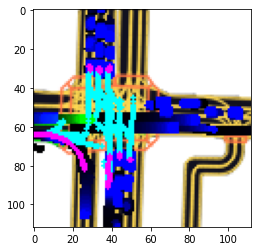

[[0.21194227 0.5761155  0.21194227]]
[[0.2119989 0.5760022 0.2119989]]


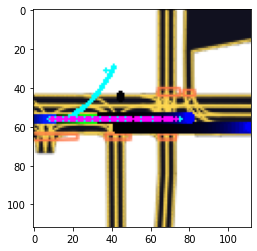

[[0.21194951 0.57610095 0.21194951]]


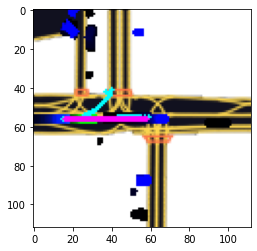

[[0.21194987 0.57610023 0.21194987]]


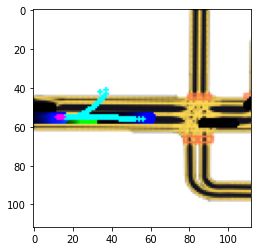

[[0.2119587 0.5760826 0.2119587]]
[[0.21507752 0.569845   0.21507749]]


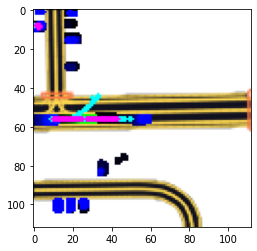

[[0.21708466 0.5658307  0.21708466]]
[[0.21531971 0.56936055 0.2153197 ]]
[[0.21194239 0.57611525 0.21194239]]
[[0.21743959 0.5651209  0.21743956]]


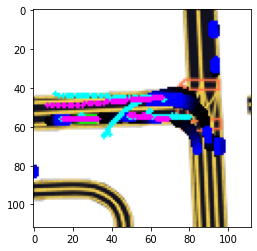

[[0.21705097 0.5658981  0.21705095]]
[[0.21532132 0.5693574  0.2153213 ]]
[[0.21194208 0.5761159  0.21194208]]
[[0.21639179 0.56721646 0.21639176]]
[[0.21194223 0.57611555 0.21194223]]


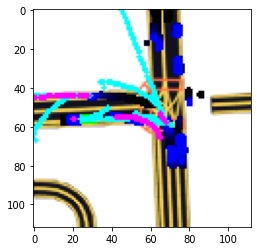

[[0.21594499 0.56811005 0.21594498]]
[[0.21739918 0.56520164 0.21739917]]
[[0.21689704 0.5662059  0.21689703]]
[[0.21447323 0.5710535  0.21447323]]
[[0.21658078 0.5668385  0.21658073]]
[[0.21194343 0.5761131  0.21194343]]


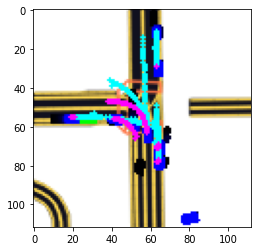

[[0.22120175 0.5575965  0.2212017 ]]
[[0.22107098 0.5578581  0.22107093]]
[[0.21686405 0.56627196 0.21686403]]
[[0.2152904  0.56941926 0.21529038]]
[[0.21236011 0.5752798  0.21236011]]
[[0.21582817 0.56834364 0.21582815]]


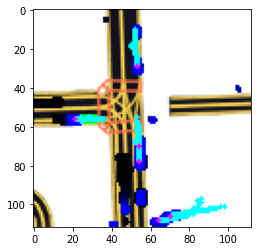

[[0.21523967 0.5695207  0.21523967]]
[[0.21337748 0.57324505 0.21337745]]
[[0.21307063 0.5738587  0.21307063]]
[[0.2132627 0.5734745 0.2132627]]
[[0.2125132 0.5749736 0.2125132]]
[[0.2136492  0.57270163 0.2136492 ]]
[[0.21417877 0.57164246 0.21417877]]
[[0.21355231 0.5728954  0.21355231]]


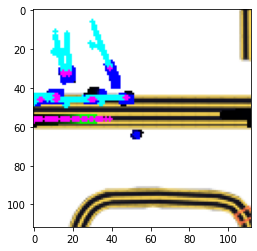

[[0.21194316 0.5761137  0.21194316]]
[[0.21363147 0.5727371  0.21363144]]
[[0.2121483  0.57570344 0.2121483 ]]
[[0.21195291 0.5760942  0.21195291]]
[[0.21257262 0.57485473 0.21257262]]


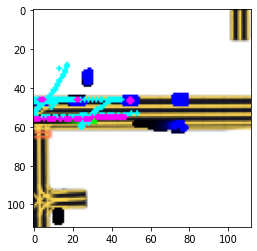

[[0.21285097 0.5742981  0.21285097]]
[[0.21194229 0.5761154  0.21194229]]
[[0.21195091 0.57609814 0.21195091]]


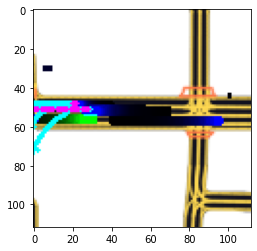

[[0.21204425 0.57591146 0.21204425]]
[[0.21194354 0.5761129  0.21194354]]
[[0.21197191 0.5760561  0.21197191]]
[[0.2119896 0.5760208 0.2119896]]


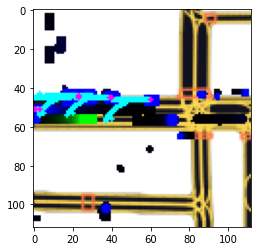

[[0.21205036 0.5758993  0.21205036]]


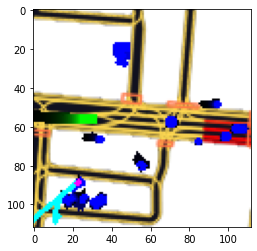

[[0.21295226 0.5740955  0.21295226]]
[[0.21200478 0.57599044 0.21200478]]
[[0.2129915 0.574017  0.2129915]]
[[0.21194239 0.5761152  0.21194239]]
[[0.21392918 0.57214165 0.21392916]]
[[0.212937 0.574126 0.212937]]
[[0.21201013 0.5759797  0.21201013]]
[[0.21194777 0.5761044  0.21194777]]
[[0.21219872 0.57560253 0.21219872]]
[[0.21194279 0.5761144  0.21194279]]
[[0.21194322 0.5761136  0.21194322]]
[[0.21197194 0.5760561  0.21197194]]


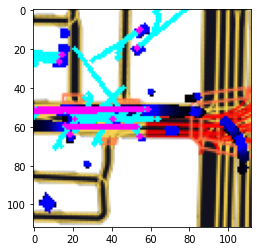

[[0.21386753 0.5722649  0.21386753]]
[[0.2133363 0.5733274 0.2133363]]
[[0.21202932 0.5759414  0.21202932]]
[[0.21197179 0.5760565  0.21197179]]
[[0.21497443 0.57005113 0.21497442]]
[[0.21334971 0.5733006  0.21334971]]
[[0.2119606 0.5760788 0.2119606]]
[[0.21199271 0.5760146  0.21199271]]
[[0.21194576 0.5761085  0.21194576]]


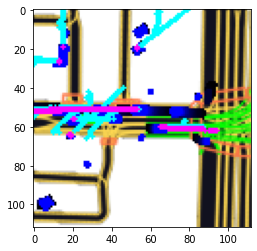

[[0.21203609 0.5759278  0.21203609]]
[[0.21196437 0.57607126 0.21196437]]
[[0.21973617 0.5605277  0.21973611]]
[[0.21236958 0.5752609  0.21236958]]
[[0.21194765 0.57610464 0.21194765]]


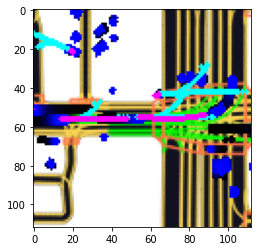

[[0.21227823 0.5754435  0.21227823]]
[[0.21194224 0.57611555 0.21194224]]
[[0.21217652 0.575647   0.21217652]]
[[0.21267007 0.5746599  0.21267007]]
[[0.2119421 0.5761158 0.2119421]]
[[0.21203235 0.5759353  0.21203235]]
[[0.21730615 0.5653877  0.21730614]]
[[0.2119683  0.57606333 0.2119683 ]]
[[0.21195841 0.5760832  0.21195841]]


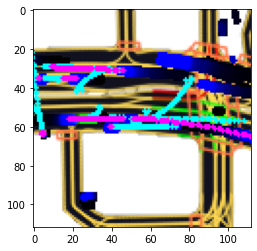

[[0.21194214 0.5761157  0.21194214]]
[[0.21194215 0.57611567 0.21194215]]
[[0.21215439 0.5756912  0.21215439]]
[[0.21210891 0.5757821  0.21210891]]
[[0.21197459 0.5760509  0.21197459]]


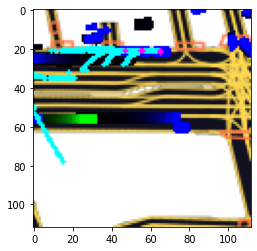

[[0.21204501 0.57591    0.21204501]]
[[0.21194215 0.57611567 0.21194215]]


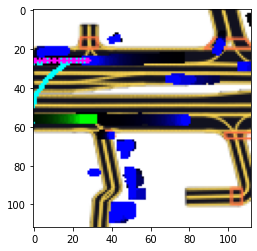

[[0.21238896 0.575222   0.21238896]]
[[0.21207318 0.57585365 0.21207318]]
[[0.21320719 0.5735856  0.21320719]]
[[0.21247347 0.5750531  0.21247347]]
[[0.21365227 0.57269543 0.21365227]]
[[0.21195683 0.5760864  0.21195683]]
[[0.2120507 0.5758986 0.2120507]]


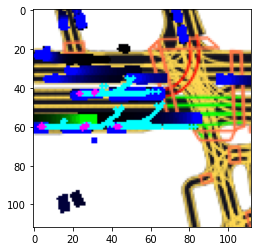

[[0.21338667 0.57322663 0.21338667]]
[[0.21197335 0.5760533  0.21197335]]
[[0.21287696 0.5742461  0.21287696]]
[[0.2119909  0.57601815 0.2119909 ]]
[[0.21222351 0.57555294 0.21222351]]
[[0.21242397 0.5751521  0.21242397]]
[[0.21199106 0.5760179  0.21199106]]


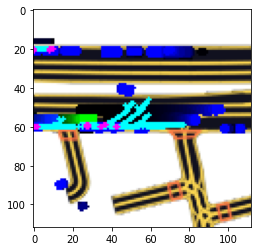

[[0.21824262 0.56351477 0.21824259]]
[[0.21370177 0.5725965  0.21370175]]
[[0.2135534 0.5728932 0.2135534]]
[[0.21212345 0.5757531  0.21212345]]
[[0.21791025 0.56417954 0.21791022]]
[[0.21443743 0.5711252  0.21443741]]
[[0.21328422 0.5734315  0.21328422]]
[[0.21230559 0.57538885 0.21230559]]
[[0.21548827 0.5690235  0.21548826]]
[[0.21198668 0.5760266  0.21198668]]


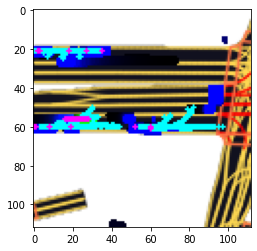

In [13]:
multi_vis = True
cvae.eval()
torch.set_grad_enabled(False)

# build a dict to retrieve future trajectories from GT
gt_rows = {}
for row in read_gt_csv(eval_gt_path):
    gt_rows[row["track_id"] + row["timestamp"]] = row["coord"]

eval_ego_dataset = EgoDataset(cfg, eval_zarr, rasterizer)
eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer)

for frame_number in range(99, len(eval_zarr.frames), 100):  # start from last frame of scene_0 and increase by 100
    agent_indices = eval_dataset.get_frame_indices(frame_number) 
    if not len(agent_indices):
        continue

    # get AV point-of-view frame
    data_ego = eval_ego_dataset[frame_number]
    im_ego = rasterizer.to_rgb(data_ego["image"].transpose(1, 2, 0))
    center = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]
    
    predicted_positions = []
    predicted_positions1 = []
    predicted_positions2 = []
    predicted_positions3 = []
    target_positions = []

    if multi_vis == True:
        for v_index in agent_indices:
            data_agent = eval_dataset[v_index]
            out_net,confs,_,_,_,_ = cvae(data_agent)
            confs = confs.detach().cpu().numpy()
            print(confs)
            out_net1 = out_net[0][0]
            out_net2 = out_net[0][1]
            out_net3 = out_net[0][2]
            out_pos1 = out_net.reshape(-1, 2).detach().cpu().numpy()
            out_pos2 = out_net.reshape(-1, 2).detach().cpu().numpy()
            out_pos3 = out_net.reshape(-1, 2).detach().cpu().numpy()
            # store absolute world coordinates
            predicted_positions1.append(transform_points(out_pos1, data_agent["world_from_agent"]))
            predicted_positions2.append(transform_points(out_pos2, data_agent["world_from_agent"]))
            predicted_positions3.append(transform_points(out_pos3, data_agent["world_from_agent"]))
            # retrieve target positions from the GT and store as absolute coordinates
            track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
            target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])


        # convert coordinates to AV point-of-view so we can draw them
        predicted_positions1 = transform_points(np.concatenate(predicted_positions1), data_ego["raster_from_world"])
        predicted_positions2 = transform_points(np.concatenate(predicted_positions2), data_ego["raster_from_world"])
        predicted_positions3 = transform_points(np.concatenate(predicted_positions3), data_ego["raster_from_world"])
        target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])

        draw_trajectory(im_ego, predicted_positions1, (34,222,79))
        draw_trajectory(im_ego, predicted_positions2, (220,235,21))
        draw_trajectory(im_ego, predicted_positions3, PREDICTED_POINTS_COLOR)
        draw_trajectory(im_ego, target_positions, TARGET_POINTS_COLOR)

        plt.imshow(im_ego)
        plt.show()

    else:
        for v_index in agent_indices:
            data_agent = eval_dataset[v_index]
            out_net,confs,_,_,_,_ = cvae(data_agent)
            confs = confs.detach().cpu().numpy()
    #         print(confs)
            out_net = out_net[0][np.argmax(confs)]
            out_pos = out_net.reshape(-1, 2).detach().cpu().numpy()
            # store absolute world coordinates
            predicted_positions.append(transform_points(out_pos, data_agent["world_from_agent"]))
            # retrieve target positions from the GT and store as absolute coordinates
            track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
            target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])


        # convert coordinates to AV point-of-view so we can draw them
        predicted_positions = transform_points(np.concatenate(predicted_positions), data_ego["raster_from_world"])
        target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])

        draw_trajectory(im_ego, target_positions, TARGET_POINTS_COLOR)
        draw_trajectory(im_ego, predicted_positions, PREDICTED_POINTS_COLOR)


        plt.imshow(im_ego)
        plt.show()